# Z-score visualization

---

### Tuesday, June 06, 2017
### Wednesday, June 07, 2017

> Import libraries

In [527]:
from __future__ import division
import numpy as np
import nibabel as nb
import scipy.stats as stats
from os.path import join
import matplotlib.pyplot as plt
import matplotlib
import matplotlib.patches as mpatches
import matplotlib.cm as cmx
import matplotlib.colors as colors
import matplotlib.gridspec as gridspec 
import matplotlib.patches as patches

from copy import copy

from nilearn import plotting
from nilearn.image import iter_img, index_img

import pandas as pd
import seaborn as sns
%matplotlib inline



In [228]:
melodicLoc = '/Volume/CCNC_W1_2T/2017_CHR_thalamus_microstructure_kcho/allData/prac_melodic_commandline'

> Load thalamus ROI

- to get thalamic coordinates : `thalNZ`
- to get thalamic coordinates in ravel form : `thalInd`

In [351]:
thalamus = nb.load('/Volume/CCNC_W1_2T/2017_CHR_thalamus_microstructure_kcho/allData/scripts/lh_thalamus_HOSC_60.nii.gz')           
thalData = thalamus.get_data()                                                                                                      

# Thalamic voxel coordinates
thalNZ = np.nonzero(thalData)

# Ravel form
thalInd = np.ravel_multi_index((thalNZ[0],thalNZ[1],thalNZ[2]),
                               dims=thalData.shape,order='F')
thalVoxelNum = len(thalNZ[0])

icMap_loc = '/Volume/CCNC_W1_2T/2017_CHR_thalamus_microstructure_kcho/allData/prac_melodic_commandline/fep_ds_10IC_2017_06_05/melodic_IC.nii.gz'
icMap_nb = nb.load(icMap_loc)

In [86]:
def draw_component(icMap_nb, num):
    plotting.plot_glass_brain(index_img(icMap_nb, num))        
    plt.show()
def draw_components(icMap_nb):
    for img in iter_img(icMap_nb):
        plotting.plot_glass_brain(img, display_mode='z')
    plt.show()

In [241]:
def draw_fsl_glm_mat(mat, title=None):
    componentNumber = mat.shape[1]
    
    fig, axes = plt.subplots(ncols=3, figsize=(20,10), facecolor='white')

    sns.heatmap(mat, ax=axes[0])

    thresholds = [2.3, 3.1]
    for num, threshold in enumerate(thresholds):
        mat_thr = copy(mat)
        mat_thr[mat_thr < threshold] = 0
        sns.heatmap(mat_thr, ax=axes[num+1])

    for num in range(3):
        axes[num].set_yticks(range(0,1031,100))
        axes[num].set_yticklabels(range(0,1031,100))
        axes[num].set_ylabel('Thalamic voxels')

        axes[num].set_xticklabels(range(1,componentNumber+1))
        axes[num].set_xlabel('ICA Component number')
    axes[0].set_title('no threshold')
    axes[1].set_title('Z > 2.3')
    axes[2].set_title('Z > 3.1')

    if title:
        fig.suptitle('{0}'.format(title),
                     fontsize=20)
    else:
        fig.suptitle('Output from fsl_glm, averaged across subjects'.format(threshold),
                     fontsize=20)
    plt.show()    

In [824]:
def get_cmap(N):
    '''Returns a function that maps each index in 0, 1, ... N-1 to a distinct 
    RGB color.'''
    color_norm  = colors.Normalize(vmin=0, vmax=N-1)
    scalar_map = cmx.ScalarMappable(norm=color_norm, cmap='hsv') 
    def map_index_to_rgb_color(index):
        return scalar_map.to_rgba(index)
    return map_index_to_rgb_color

In [1395]:
def pie_vox_count_threeDmap(compMax, threeDmap, icNum, cmap_dict):
    # make figure
    fig, axes = plt.subplots(ncols=1, figsize=(5,5), facecolor='white')
    pieAx = axes

    # Count number of voxels in each ICA components (voxel intensities)
    compNums, compVoxelCounts = np.unique(compMax, return_counts=True)
    comp_count = dict(zip(compNums, compVoxelCounts)) # make dictionary
    
    # remove 0 count
#     try:
#         comp_count.pop(0) 
#     except:
#         pass

    # Highlighting components with high number of voxels
    meanCount = np.array(comp_count.values()).mean()
    stdCount = np.array(comp_count.values()).std()
    oneStdGt = meanCount+stdCount # Number of count, one std above mean
    topCount = np.array(comp_count.values()) > oneStdGt
    
    explode = topCount*.5 #highlight matrix
#     explode = compVoxelCounts / compVoxelCounts.max()
#     explode = compVoxelCounts/len(compMax)

    # Draw pie graph
    pies = pieAx.pie(comp_count.values(), explode=explode,labels=[int(x) for x in comp_count.keys()])

    # Set the color of the pie graphs
    for pieG in pies[0]:
        col = cmap_dict[int(pieG.get_label())]
        pieG.set_facecolor(col)

    # If there are too many components to show
    if len(comp_count.keys()) > 14:
        topComponents = topCount * comp_count.keys()
        patchesTop = [mpatches.Patch(color=cmap_dict[x], 
                                  label='Component {0:0.0f} : {1} voxels'.format(x,comp_count[x])) for x in topComponents[topComponents.nonzero()]]
    else:
        patchesTop = [mpatches.Patch(color=cmap_dict[x], 
                                  label='Component {0:0.0f} : {1} voxels'.format(x,comp_count[x])) for x in comp_count.keys()]

    pieAx.legend(handles=patchesTop,
              loc='upper center', 
              bbox_to_anchor=(0.5, -0.2), 
              fancybox=True, 
              ncol=2, borderaxespad=0.)

    plt.show()

In [1396]:
cmaps=get_cmap(10)

# make colormaps
cmap_dict = {}
# make zero to be white
cmap_dict[0]= (1, 1, 1, 0)

for compNum in range(10):
    col = cmaps(compNum)
    cmap_dict[compNum+1] = col

cmaps = colors.LinearSegmentedColormap.from_list('hsv', 
                                                 [(compNum/10, col) for compNum,col in cmap_dict.iteritems()],
                                                 N=icNum
                                                )

In [1397]:
def draw_max_segmentation_comp(mni_data, compMax, mmthreshMap_nb, comp_count, threeDmap, icNum, cmap_dict, cmaps, testICNum, title=None):
    '''
    Show only one ICA component.
    '''
    
    # matrix threshold
    threeDmap_thresholded = threeDmap.copy()
    threeDmap_thresholded[threeDmap_thresholded!=testICNum] = 0

    fig = plt.figure(figsize=(15,10), 
                     facecolor='white')
    # Title
    plt.suptitle('ICA component number : {0}'.format(testICNum), fontsize=20)    

    # make graph grid
    gs = gridspec.GridSpec(3,5)
    
    # ICA component ax
    icAxes = plt.subplot(gs[2, :])
    plotting.plot_glass_brain(mmthreshMap_nb, colorbar=True, 
                              cmap='autumn',
                              vmin=2.5, vmax=10,
                              threshold=2.5,
#                            display_mode='z', cut_coords=10,
#                            vmax=5,
#                               threshold=0,
                              axes=icAxes, clim=(2.5,10))   
    
#     # filling in the dictionary with the component which did not survive
#     missingComps = [x for x in range(1, icNum+1) if x not in comp_count.keys()]
#     if len(missingComps) != 0:
#         for missingComp in missingComps:
#             comp_count[missingComp] = 0
    
    # brian slice axes
    baxes = []
    for i in range(0,2):
        for j in range(5):
            baxes.append(plt.subplot(gs[i, j]))

    startSlice = 35

    # color setting
    norm = colors.BoundaryNorm(range(icNum+1), cmaps.N)
    
    for axNum in range(len(baxes)):
        baxes[axNum].imshow(np.flipud(mni_data[15:75, 40:75, startSlice].T), cmap='gray')
        baxes[axNum].imshow(np.flipud(threeDmap_thresholded[15:75, 40:75, startSlice].T), 
                            cmap=cmaps,
                            norm=norm)
        baxes[axNum].set_title(startSlice, fontsize=15)
        baxes[axNum].axes.yaxis.set_ticklabels([])
        baxes[axNum].axes.xaxis.set_ticklabels([])
        baxes[axNum].grid(False)
        startSlice+=1
    
    #legend
    patches = [mpatches.Patch(color=cmap_dict[x], 
                              label='Component {0} : {1} voxels'.format(x,comp_count[x])) for x in [testICNum]]
    baxes[4].legend(handles=patches, 
               bbox_to_anchor=(0.5, 1.5), loc='upper center', 
               borderaxespad=0.)
    plt.tight_layout()
    fig.show()

In [1410]:
def get_cdict_cmaps(icNum):
    cmaps=get_cmap(icNum+1)
    
    # make colormaps
    cmap_dict = {}
    # make zero to be white
    cmap_dict[0]= (1, 1, 1, 0)

    for compNum in range(icNum):
        col = cmaps(compNum)
        cmap_dict[compNum+1] = col
        
#     cmaps = colors.LinearSegmentedColormap.from_list('hsv', 
#                                                      [(compNum/(icNum), col) for compNum,col in cmap_dict.iteritems()],
#                                                      N=icNum
#                                                     )
    cmaps = colors.ListedColormap(cmap_dict.values())
    
    return cmap_dict, cmaps

def initialize(melodicDir, title, threshold):
    '''                                                                                                                                                       
    Process melodic outputs                                                                                                                                   
    '''
    
    title = '{0} z-threshold:{1}'.format(title, threshold)
    # READ MNI image
    mniLoc = '/usr/share/fsl/5.0/data/standard/MNI152_T1_2mm.nii.gz'                                                                                      
    mni_nb = nb.load(mniLoc)
    mni_data = mni_nb.get_data()
    
    # READ ICA output
    icMap_loc = join(melodicDir, 'melodic_IC.nii.gz')                                                                                                         
    icMap_nb = nb.load(icMap_loc)                                                                                                                             
    icNum = icMap_nb.shape[3] 
                                                                                                                               
    # Loading thalamic ROI in MNI space
    #   The probabilistic tractography used 2mm Harvard-Oxford thalamus.
    #   Therefore, regardless of the resampling, 
    #     number of thalamic voxel tractography = number of thalamic voxels
    thalamusLoc = '/Volume/CCNC_W1_2T/2017_CHR_thalamus_microstructure_kcho/allData/scripts/lh_thalamus_HOSC_60.nii.gz'                                                                                                                                                                                             
    thalamus = nb.load(thalamusLoc)                                                                                                                                      
    thalData = thalamus.get_data()
    thalData_ravelled = thalData.ravel()
    # thalamic coordinates in 3D
    thalNZ = np.nonzero(thalData) 
    # thalamic coordinates in ravel array
    thalInd = np.ravel_multi_index((thalNZ[0],thalNZ[1],thalNZ[2]),                                                                                           
                               dims=thalData.shape,                                                                                                           
                               order='F') 
    thalVoxelNum = len(thalNZ[0]) # number of thalamic voxels    

    # Loading glm outputs of each subjects
    # from 10_postmelodic.py -i ${melodicDir}
    mat = np.load(join(melodicDir, 'fsl_glm_mat_sub.npy'))
#     threshold = 2.3
    mat_thr = mat.copy()
    mat_thr[mat_thr<threshold] = 0
    
    mat_mean_across_subjects = mat.mean(axis=2)
    
    # make colormaps for graph
    # cmap_dict[range of colors]
    # including 0:white
    cmap_dict, cmaps = get_cdict_cmaps(icNum)
    
    # assigning a component that has greatest z-score at each voxel
#     compMax = mat_thr.mean(axis=2).argmax(axis=1) 
    new_mat = np.zeros((thalVoxelNum, icNum+1))
    new_mat[:, 1:] = mat_thr.argmax(axis=2)
    compMax = new_mat.argmax(axis=1)

#     compMax = mat.argmax(axis=2).argmax(axis=1)
    
    # Make the components start from 1
#     compMax = compMax + 1
    compNums, compVoxelCounts = np.unique(compMax, return_counts=True)
    comp_count = dict(zip(compNums, compVoxelCounts))

    # filling in the dictionary with the component which did not survive
    missingComps = [x for x in range(icNum+1) if x not in comp_count.keys()]
    print missingComps, 'missingComps'
    if len(missingComps) != 0:
        for missingComp in missingComps:
            comp_count[missingComp] = 0
        
            
    # Convert thalamic ravelled matrix to whole brain ravelled matrix
    whole_brain_ravelled = np.zeros_like(thalData_ravelled)
    whole_brain_ravelled[thalInd] = compMax[:]
    whole_brain = whole_brain_ravelled.reshape([thalData.shape[0], 
                                                thalData.shape[1], 
                                                thalData.shape[2]], order='F')
    
    
    draw_fsl_glm_mat(mat_mean_across_subjects, title)
    pie_vox_count_threeDmap(compMax, threeDmap, icNum, cmap_dict)    
    draw_max_segmentation_group(mni_data, compMax, comp_count, whole_brain, icNum, cmap_dict, cmaps, title)

    testIcNum = 3
    for testIcNum in range(icNum):
        mmthreshMap = join(melodicDir, 'stats', 'thresh_zstat{0}.nii.gz'.format(testIcNum+1))
        mmthreshMap_nb = nb.load(mmthreshMap)
        draw_max_segmentation_comp(mni_data, compMax, mmthreshMap_nb, comp_count, whole_brain, icNum, cmap_dict, cmaps, testIcNum+1)


#     ani = make_gif(threeDmap, cmaps, title)
#     return ani

In [1411]:
def draw_max_segmentation_group(mni_data, compMax, comp_count, threeDmap, icNum, cmap_dict, cmaps, title=None):
    fig = plt.figure(figsize=(20,10), 
                     facecolor='white')
    
    # make graph grid
    gs = gridspec.GridSpec(3,5)
    # component voxel number graph
    ax = plt.subplot(gs[0,:])
      
    bars = ax.bar(comp_count.keys(), 
                  comp_count.values(), align='center')
    ax.set_xlim([0.5, icNum+0.5])
    ax.xaxis.set_ticks(np.arange(1, icNum+1, 1))
    ax.grid(False)
    ax.set_facecolor('white')

    # bar color change
    for num, bar in enumerate(bars):
        col = cmap_dict[num]
        bar.set_color(col)
        
    if title:
        ax.set_title(title, 
                     fontsize=20)
    else:
        ax.set_title('Number of voxels assigned to each ICA components', 
                     fontsize=20)
    ax.set_xlabel('ICA components', fontsize=15)
    ax.set_ylabel('Number of voxels assigned', fontsize=15)    
    
    
    # brian slice imshow
    baxes = []
    for i in range(1,3):
        for j in range(5):
            baxes.append(plt.subplot(gs[i, j]))

    startSlice = 35
    norm = colors.BoundaryNorm(range(icNum+1), cmaps.N)
    
#     testICNum = 8
#     threeDmap[threeDmap!=testICNum] = 0
    
    for axNum in range(len(baxes)):
        baxes[axNum].imshow(np.flipud(mni_data[15:75, 40:75, startSlice].T), cmap='gray')
        baxes[axNum].imshow(np.flipud(threeDmap[15:75, 40:75, startSlice].T), 
                            cmap=cmaps,
                            norm=norm)
        baxes[axNum].set_title(startSlice, fontsize=15)
        baxes[axNum].axes.yaxis.set_ticklabels([])
        baxes[axNum].axes.xaxis.set_ticklabels([])
        baxes[axNum].grid(False)
        startSlice+=1

    #legend
#     print icNum, 'testICNum'
    print comp_count
    patches = [mpatches.Patch(color=cmap_dict[x], 
                              label='Component {0} : {1} voxels'.format(x,comp_count[x])) for x in range(1, icNum+1)]
    plt.legend(handles=patches, bbox_to_anchor=(1, 0.5), loc='center left', borderaxespad=0.)
#     ax8.legend(handles=patches, 
#                loc='upper center', 
#                bbox_to_anchor=(0.5, -0.05), 
#                fancybox=True, 
#                ncol=5, borderaxespad=0.)
    plt.tight_layout()
    fig.show()

> Load matrix

# 3mm, 4mm FWHM, 10 ICA

#### melodicDir = join(melodicLoc, 'fep_ds_4s_3ds_10_IC_2017_06_08') 
initialize(melodicDir, '3mm, 4 FWHM, 10 ICA', 2.3)

[8, 10] missingComps


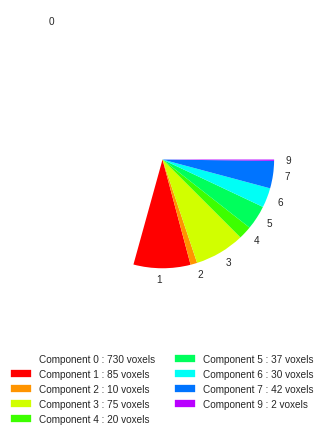

{0: 730, 1: 85, 2: 10, 3: 75, 4: 20, 5: 37, 6: 30, 7: 42, 8: 0, 9: 2, 10: 0}


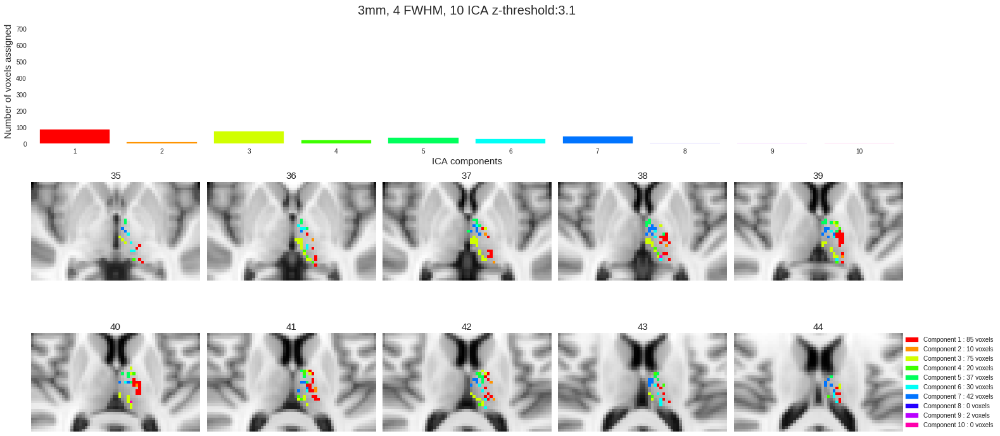

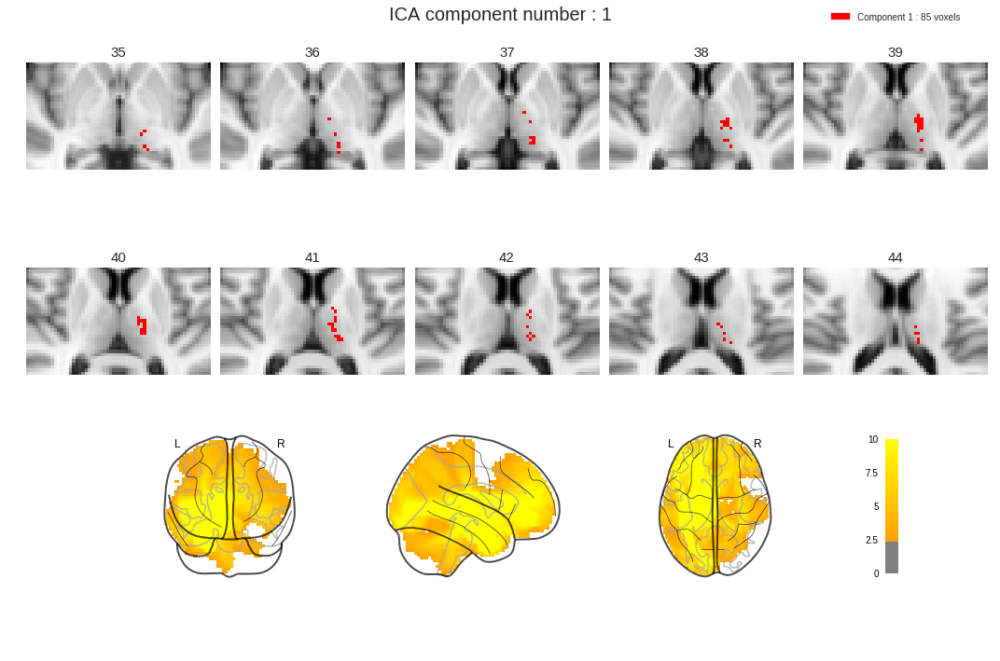

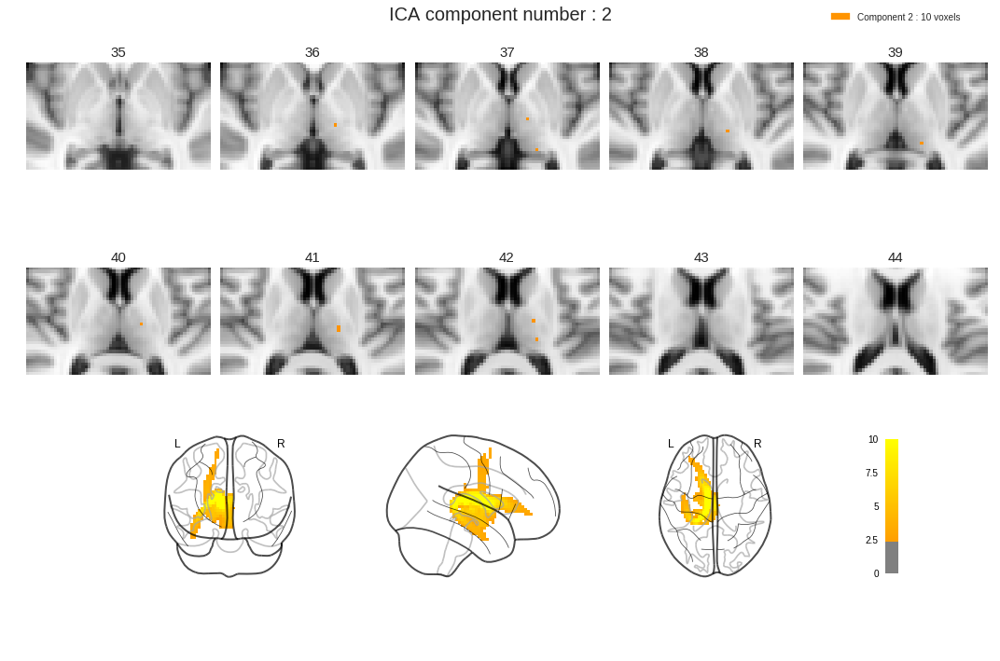

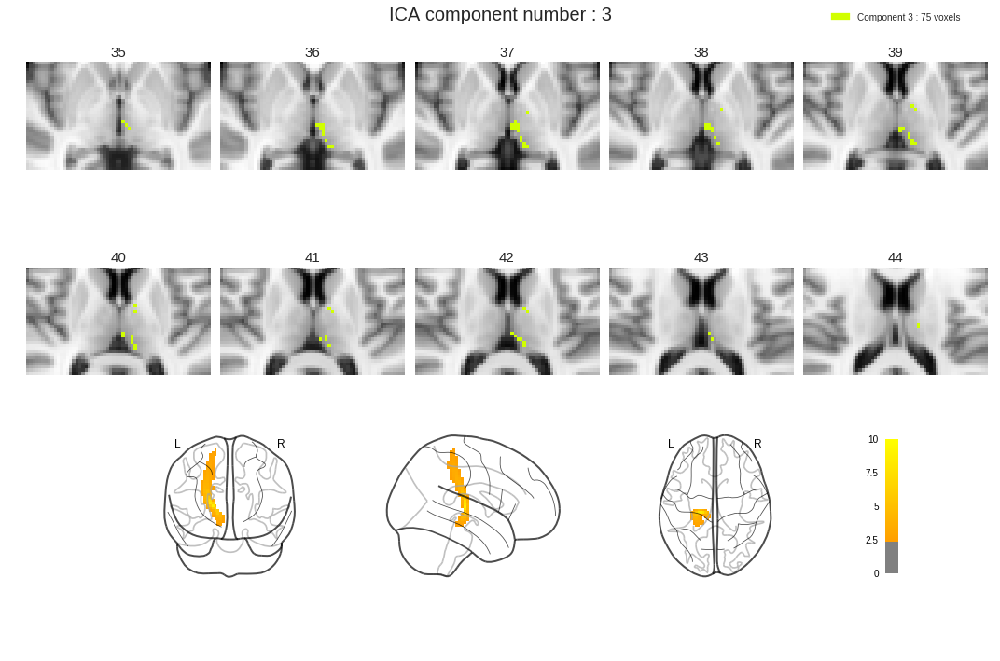

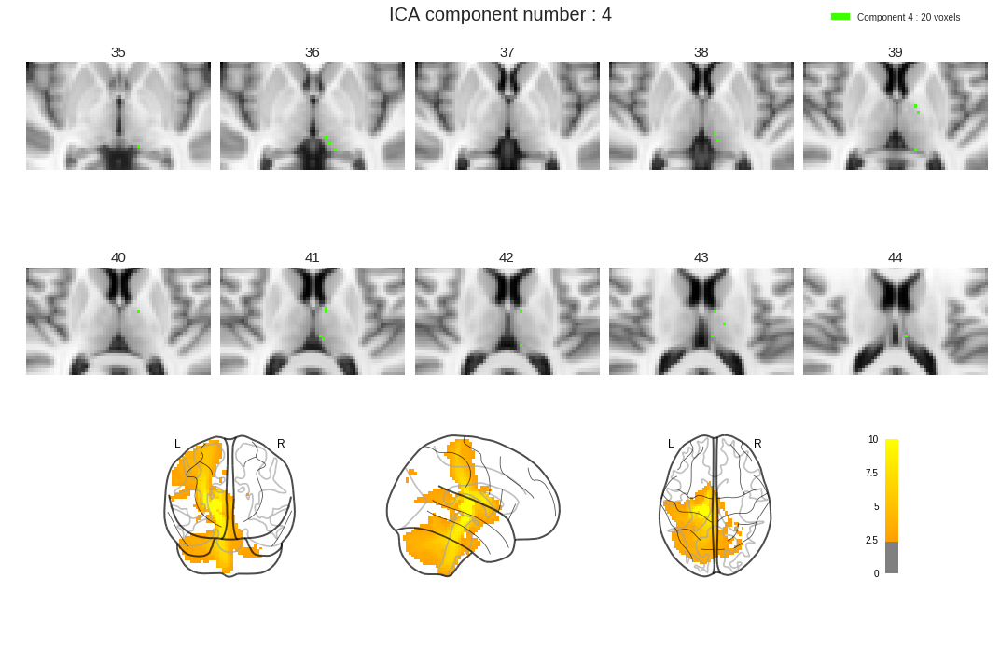

...

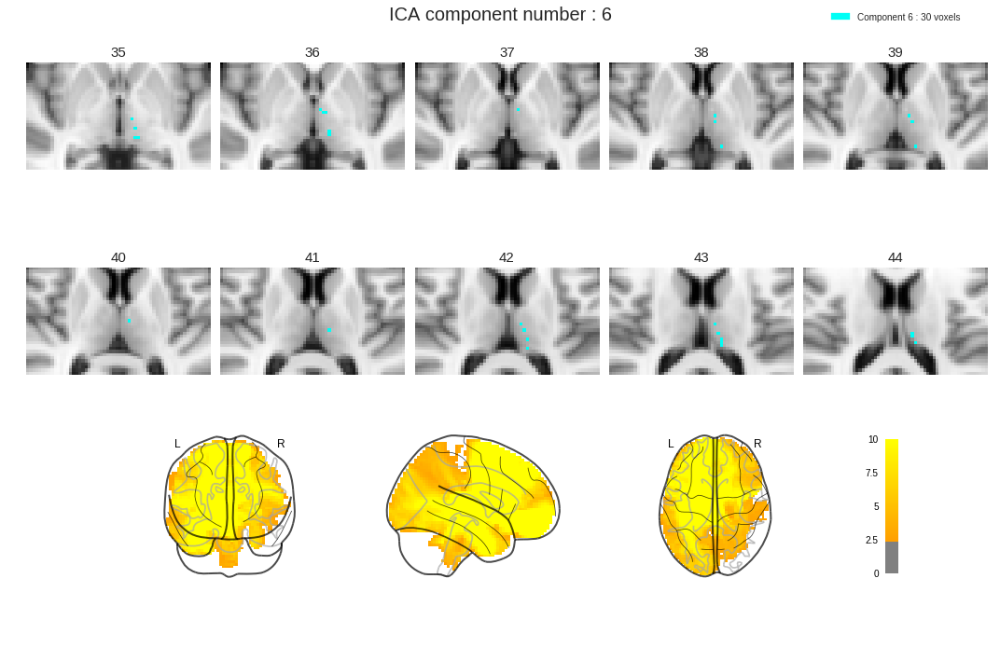

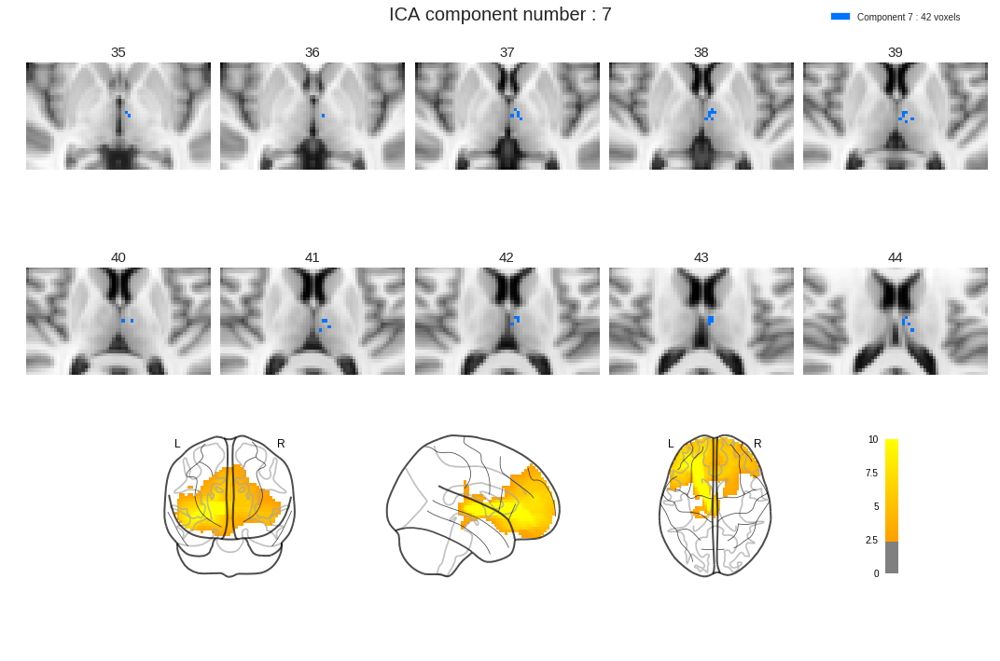

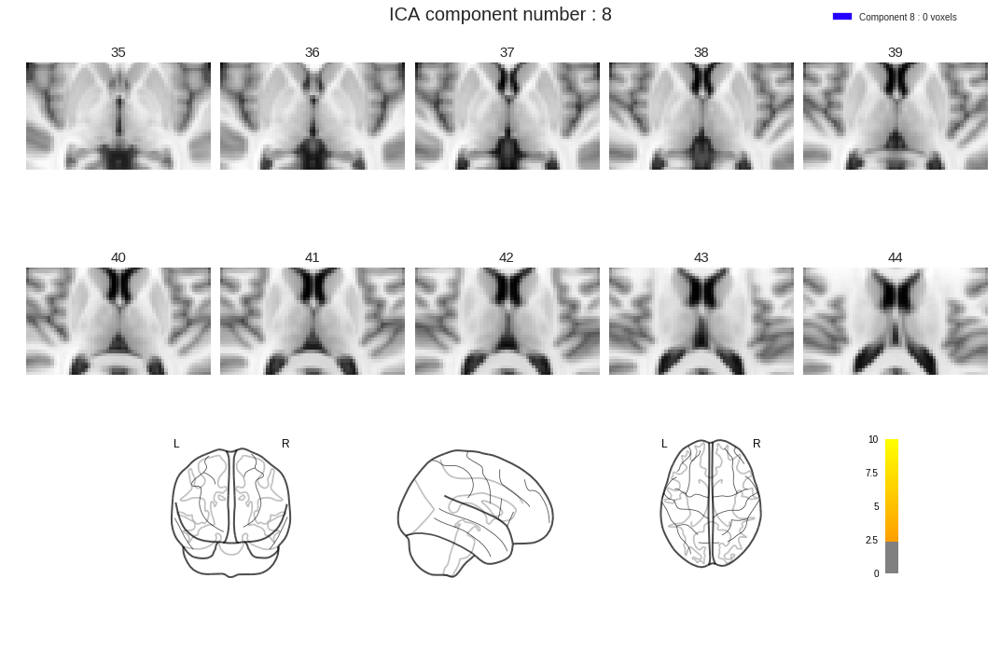

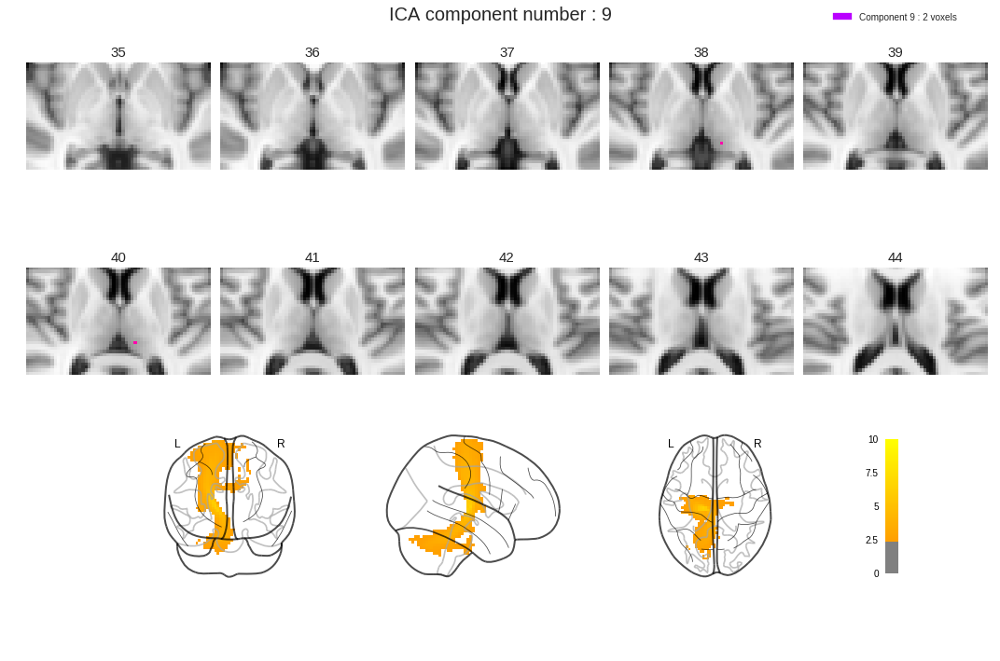

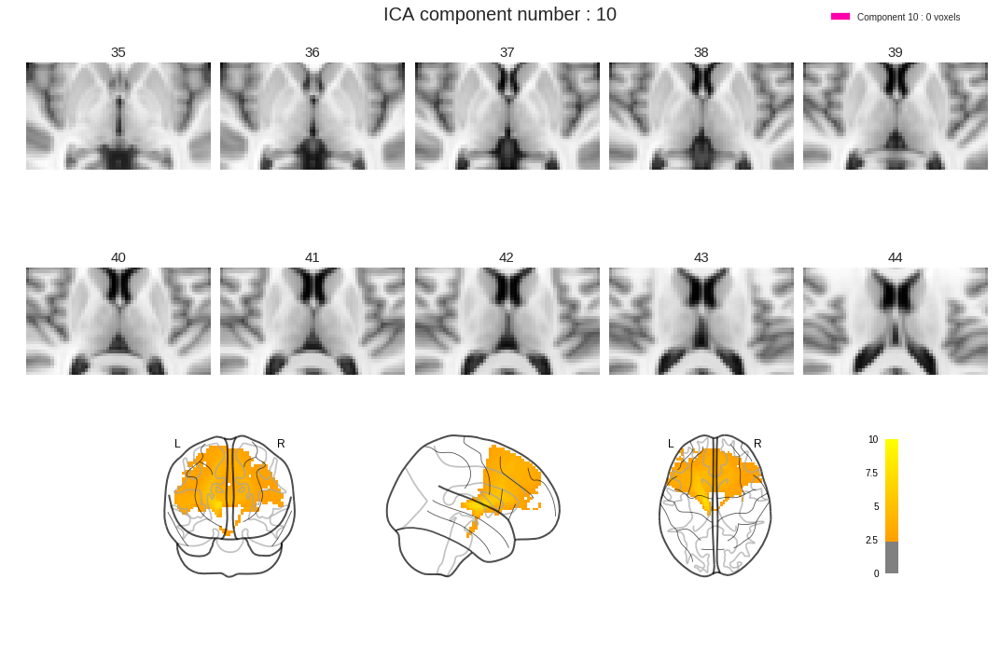

In [1405]:
melodicDir = join(melodicLoc, 'fep_ds_4s_3ds_10_IC_2017_06_08') 
initialize(melodicDir, '3mm, 4 FWHM, 10 ICA', 3.1)

# 3mm, 10 ICA

[] missingComps


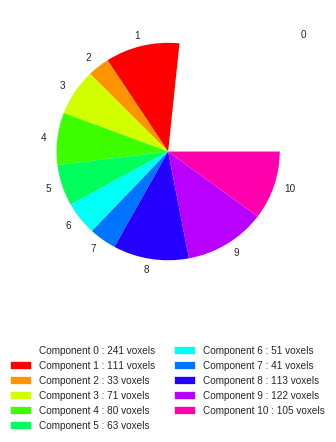

{0: 241, 1: 111, 2: 33, 3: 71, 4: 80, 5: 63, 6: 51, 7: 41, 8: 113, 9: 122, 10: 105}


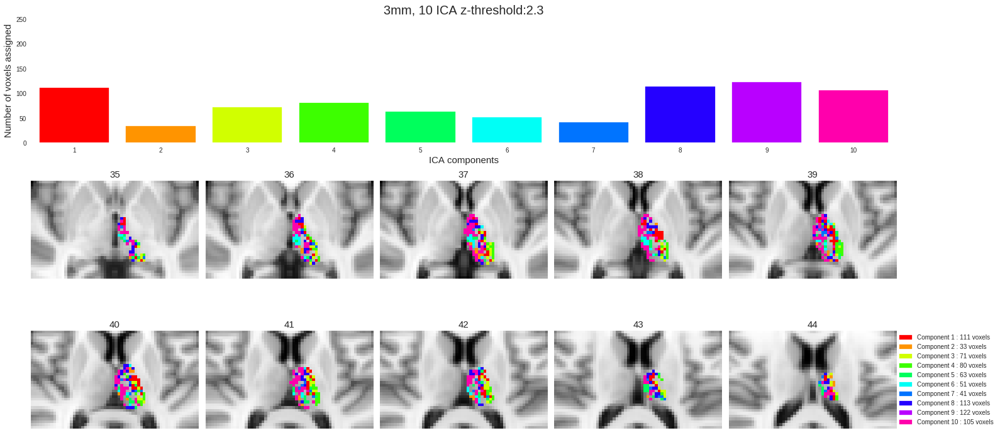

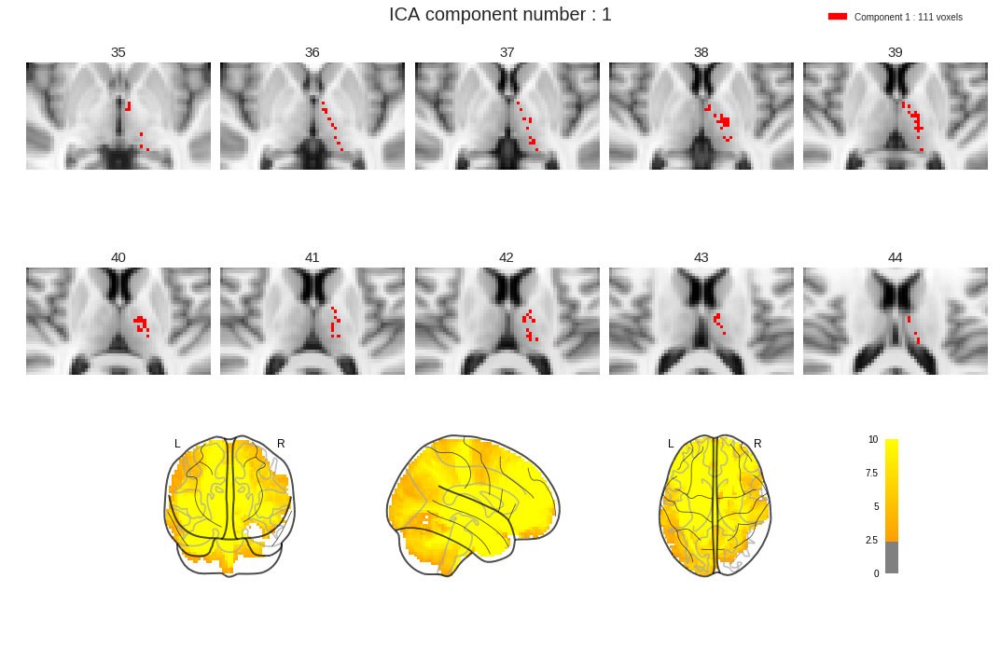

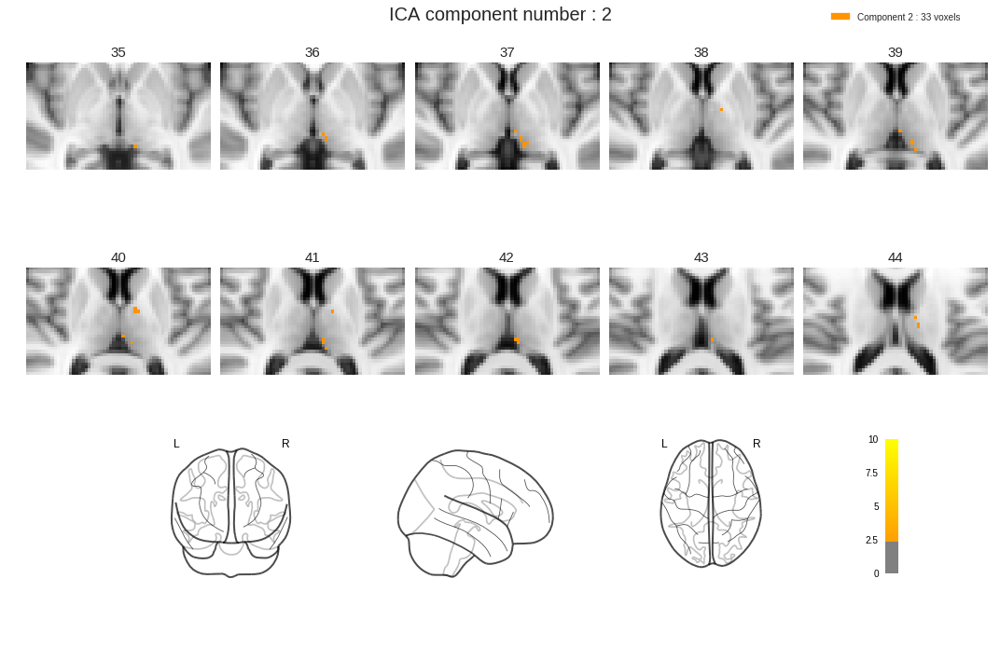

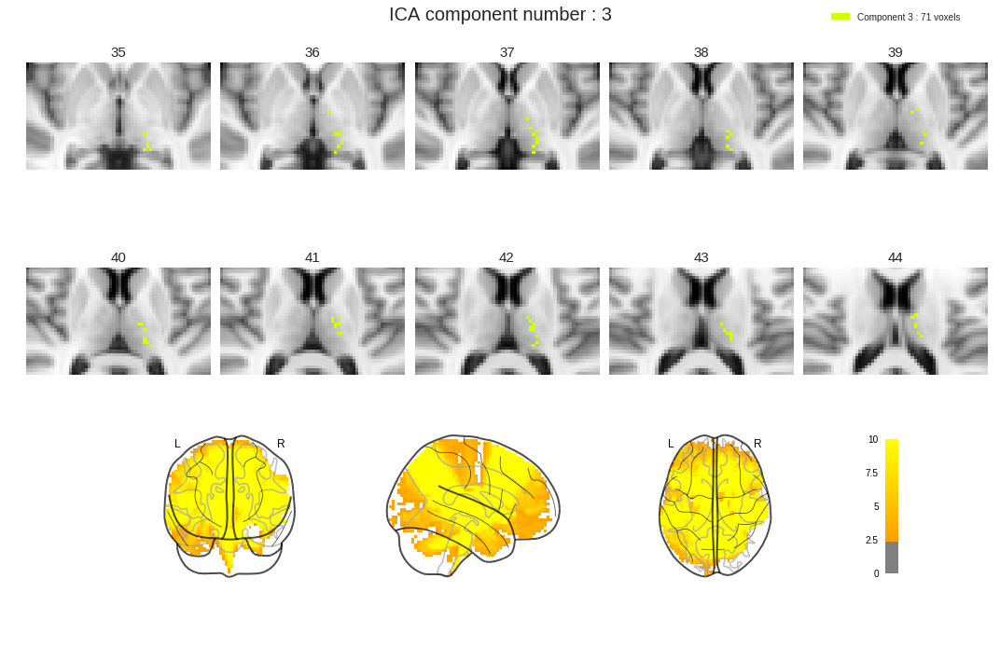

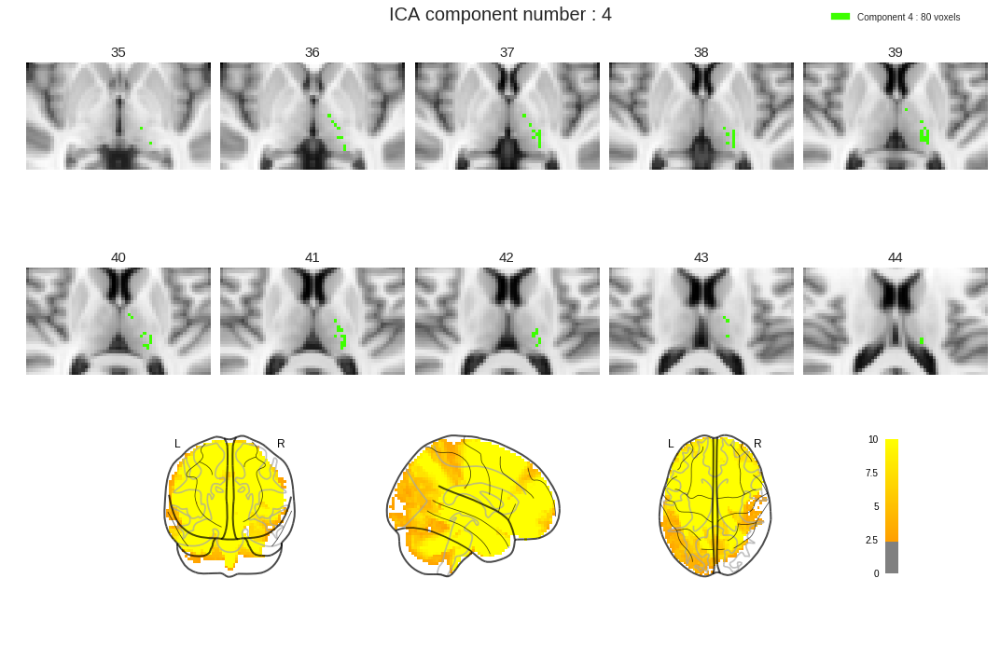

...

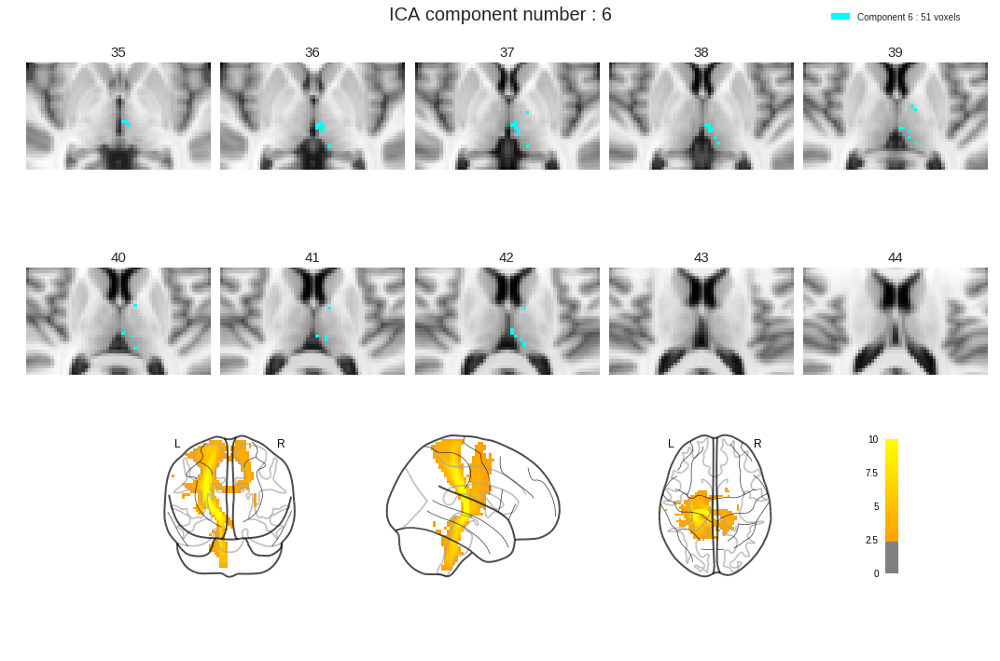

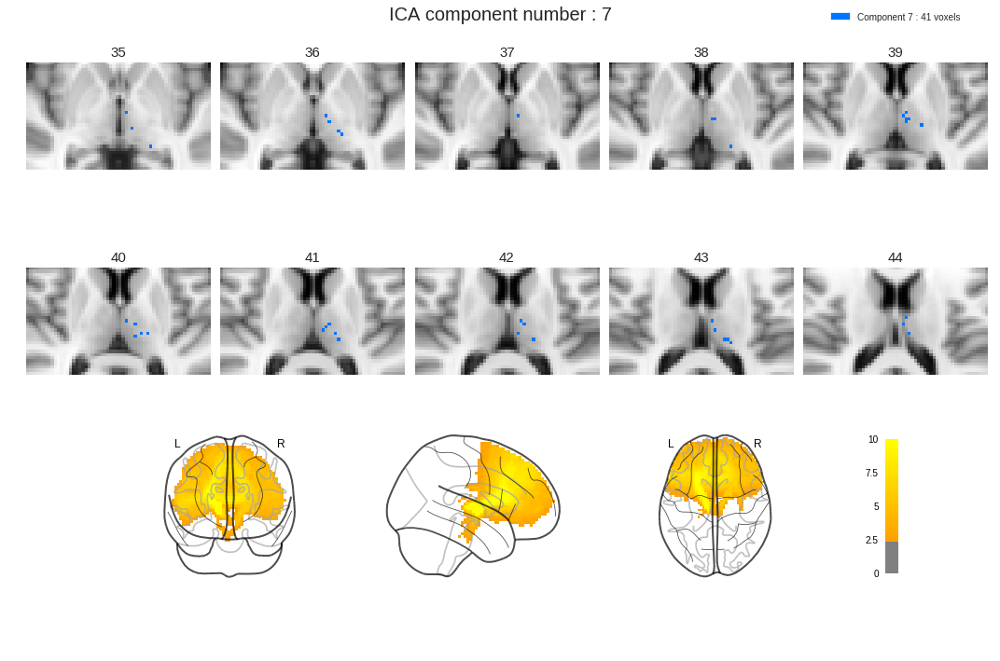

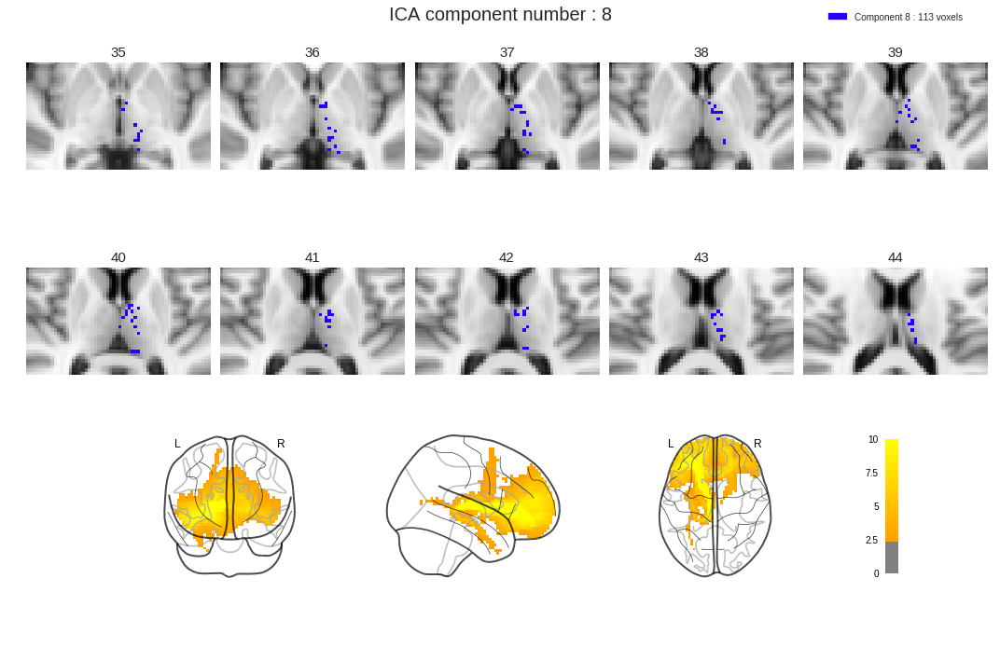

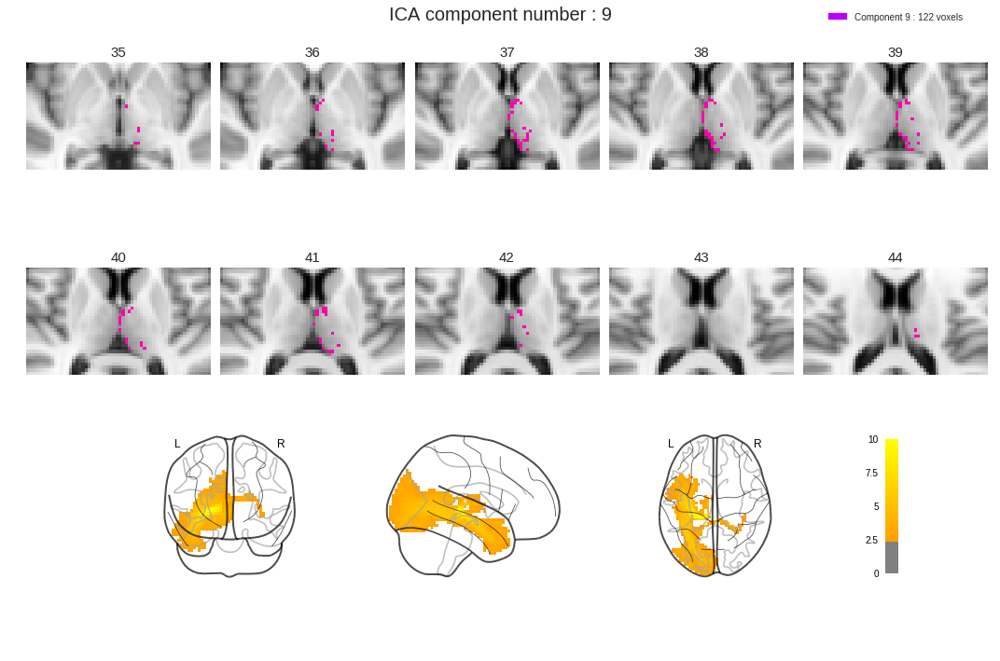

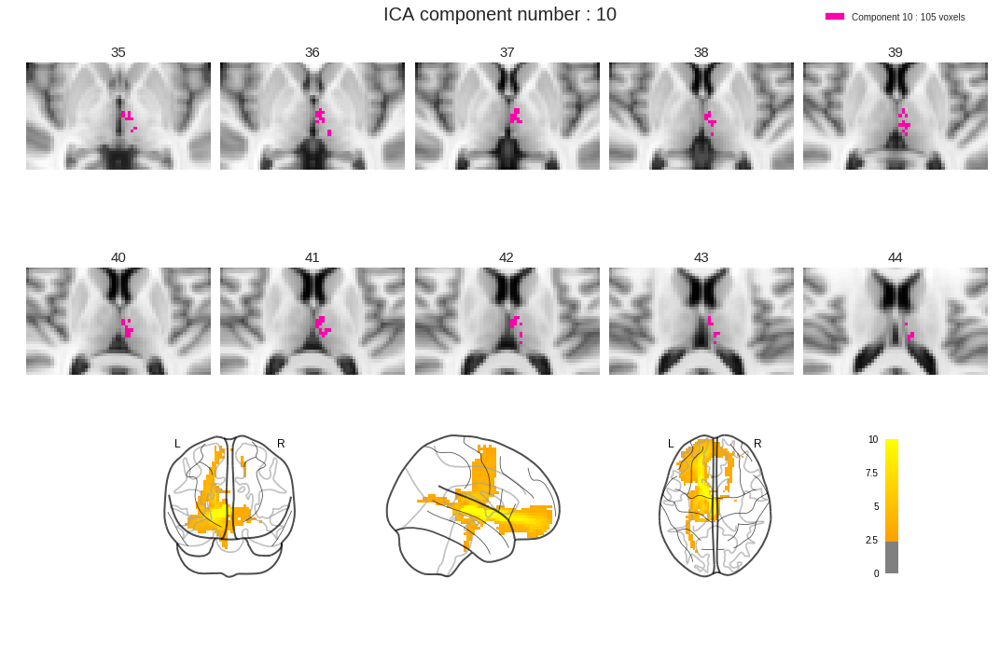

In [1406]:
melodicDir = join(melodicLoc, 'fep_ds_3_10_IC_2017_06_08') 
initialize(melodicDir, '3mm, 10 ICA', 2.3)

# 4mm 10 ICA

[] missingComps


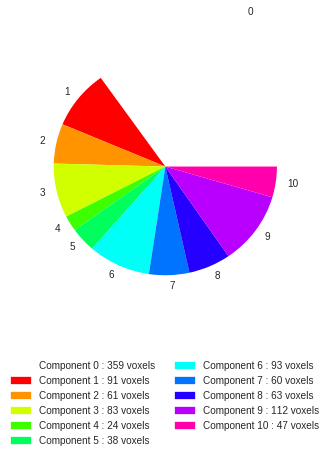

{0: 359, 1: 91, 2: 61, 3: 83, 4: 24, 5: 38, 6: 93, 7: 60, 8: 63, 9: 112, 10: 47}


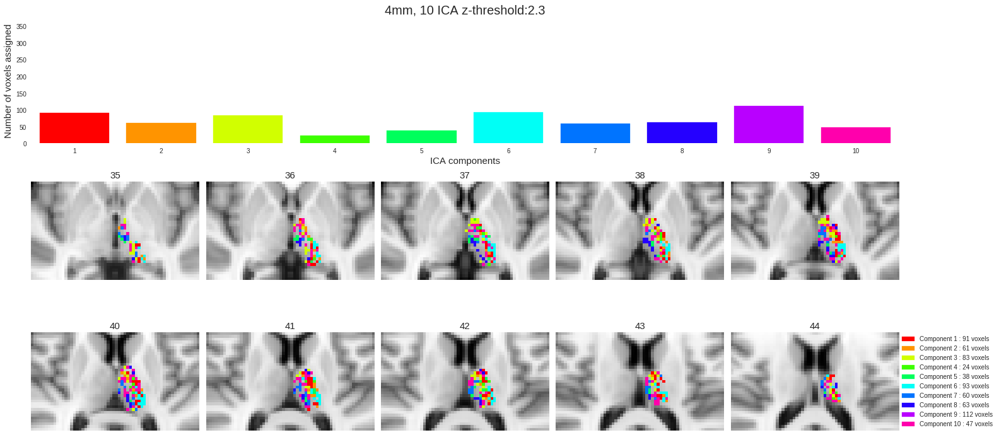

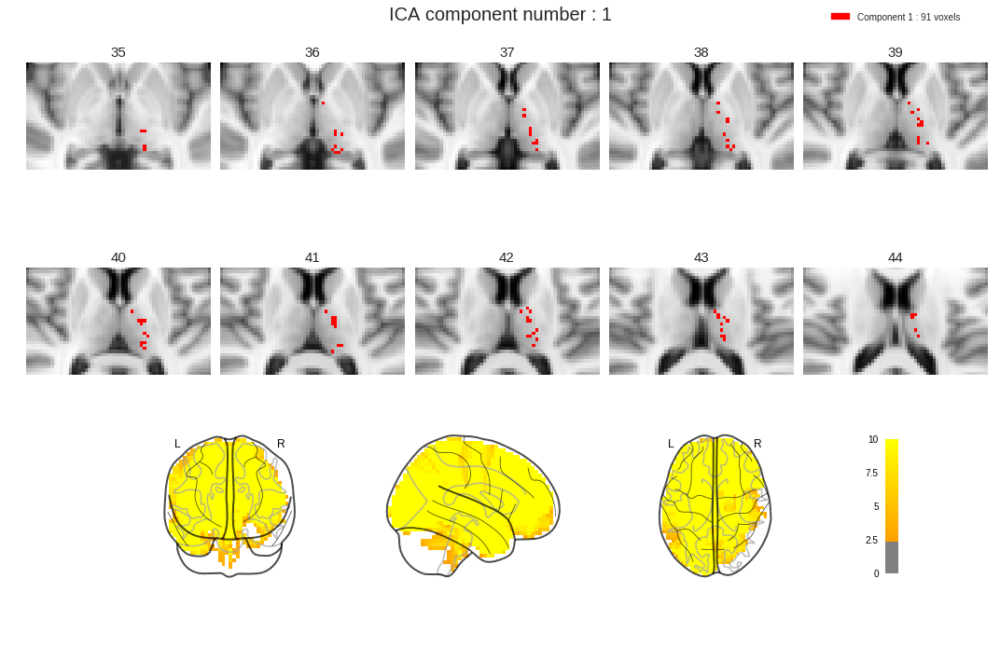

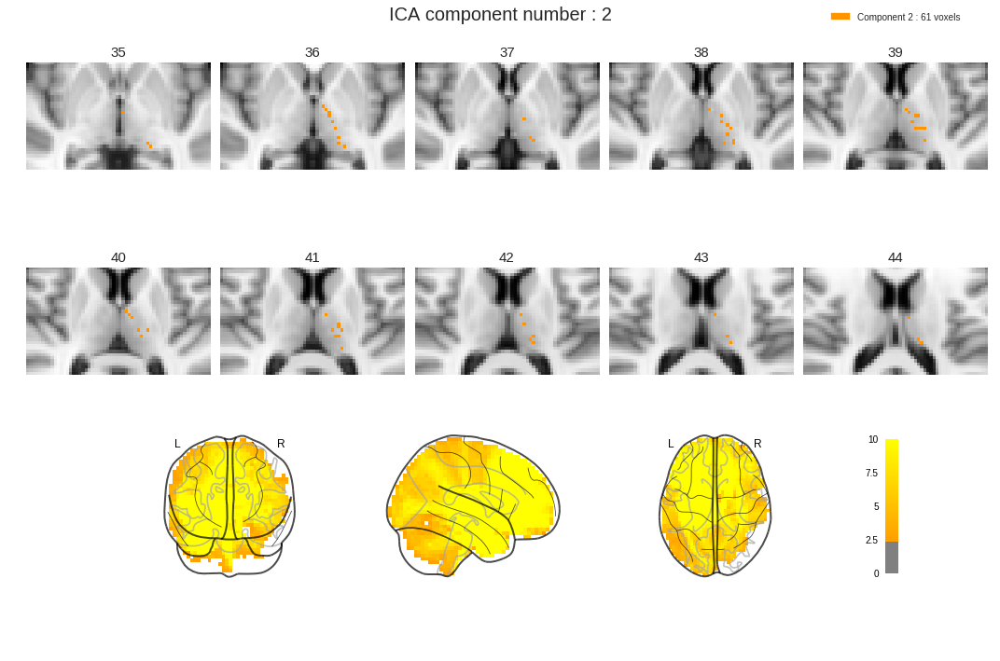

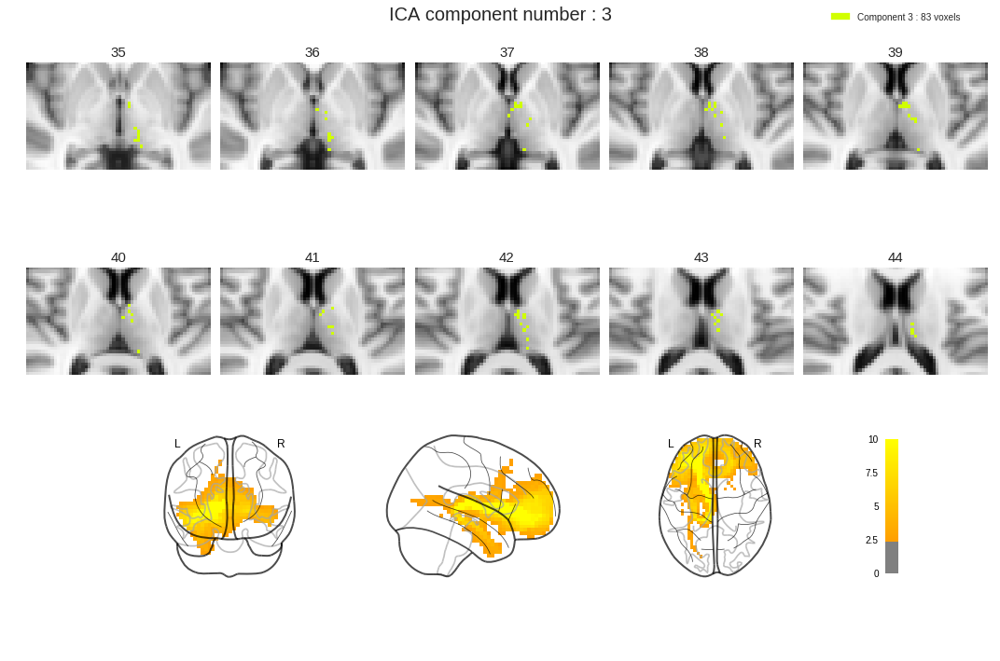

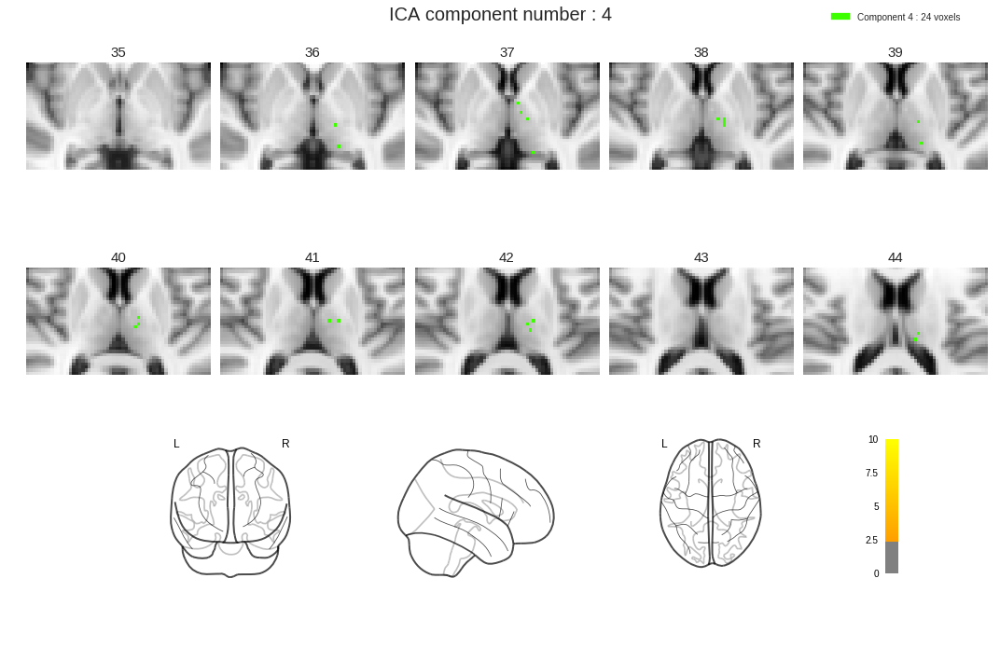

...

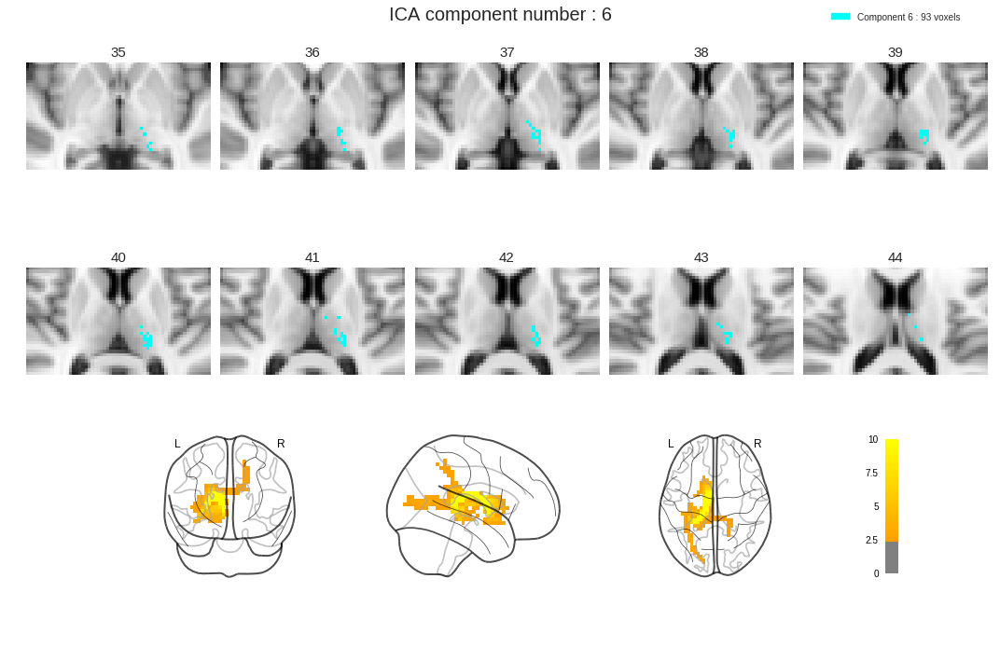

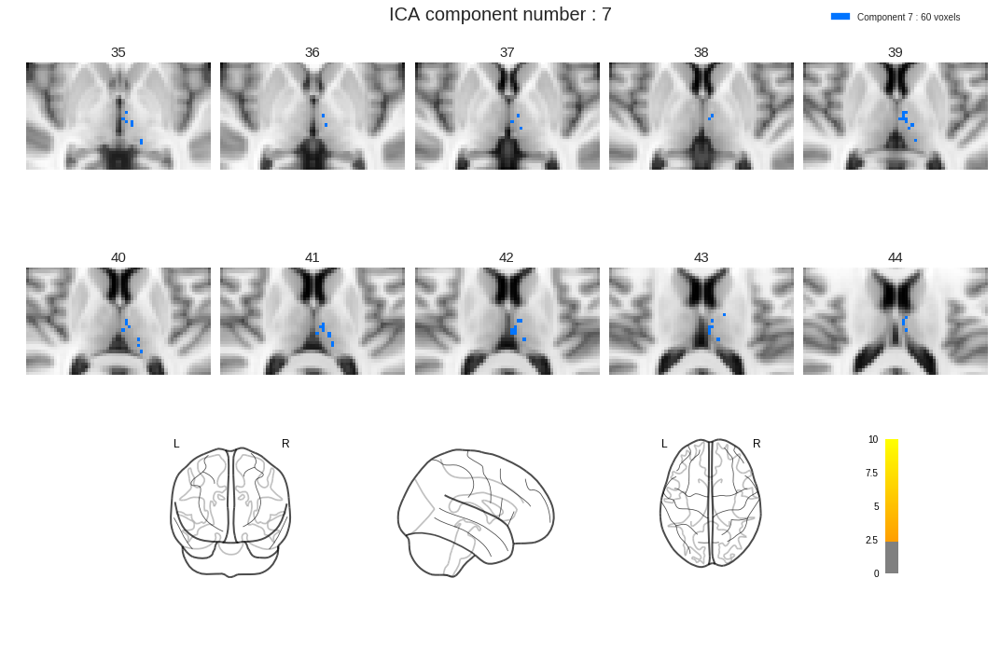

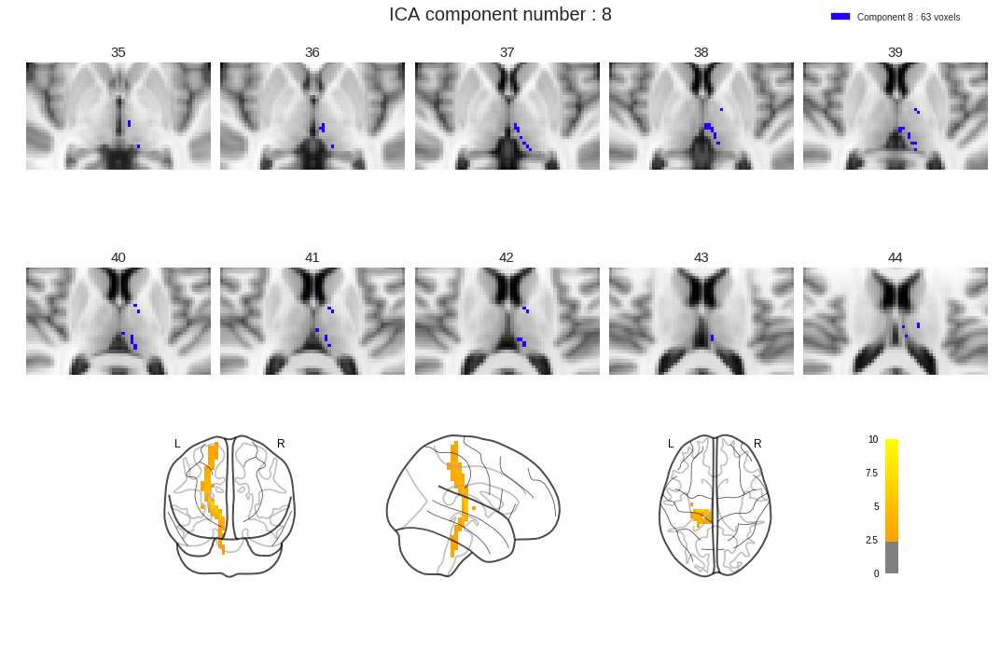

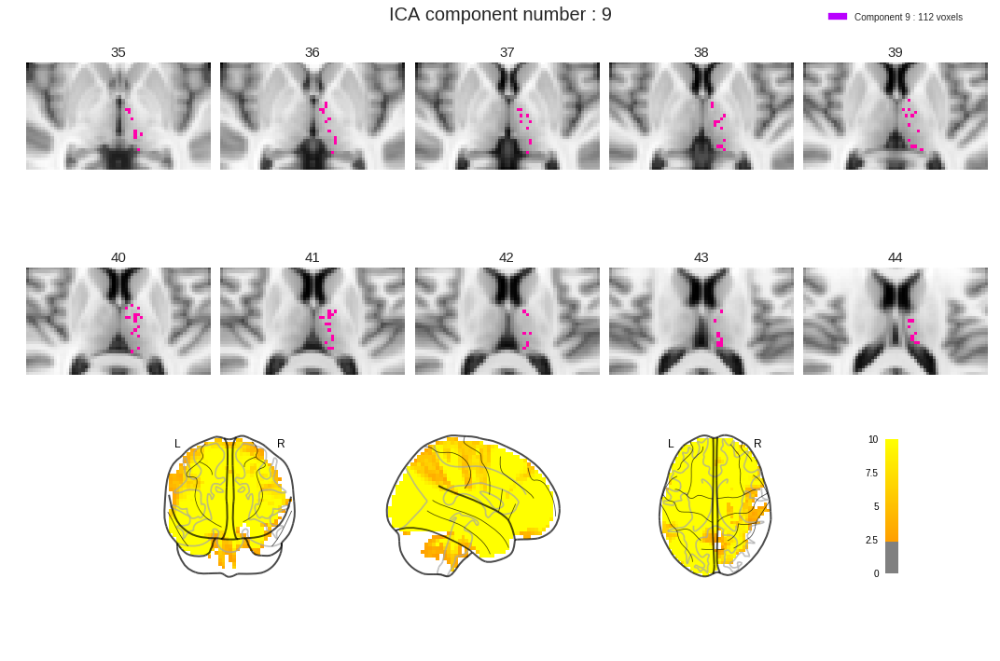

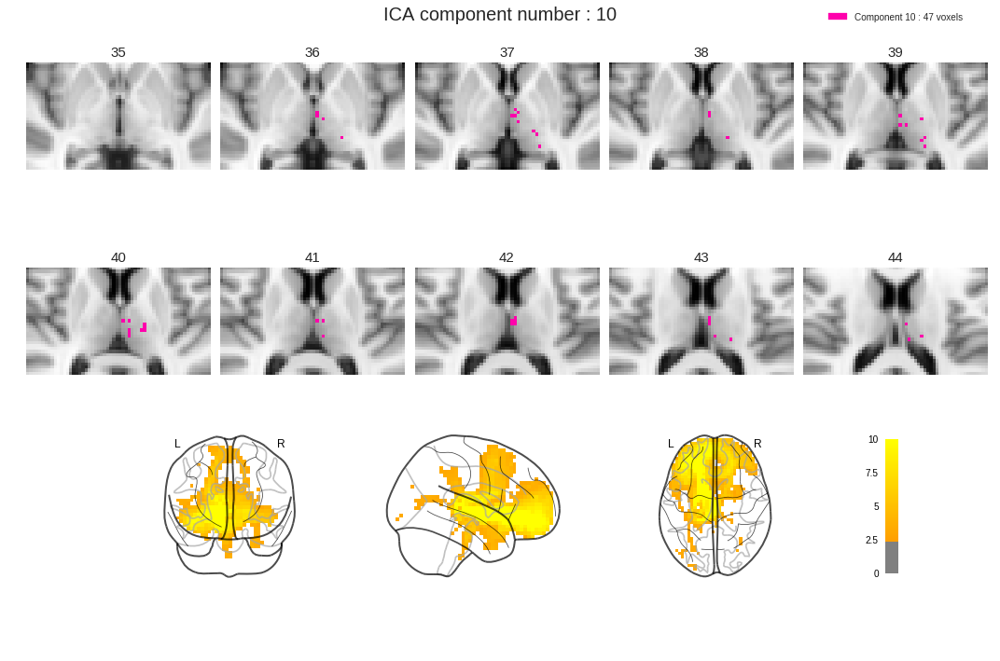

In [1407]:
melodicDir = join(melodicLoc, 'fep_ds_10IC_2017_06_05') 
initialize(melodicDir, '4mm, 10 ICA', 2.3)

[] missingComps


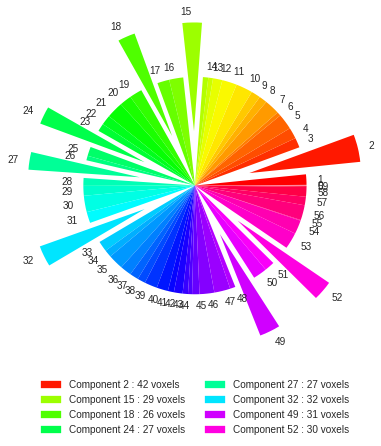

{0: 1, 1: 16, 2: 42, 3: 15, 4: 17, 5: 24, 6: 6, 7: 23, 8: 12, 9: 14, 10: 25, 11: 22, 12: 14, 13: 7, 14: 8, 15: 29, 16: 21, 17: 18, 18: 26, 19: 19, 20: 18, 21: 25, 22: 15, 23: 12, 24: 27, 25: 14, 26: 7, 27: 27, 28: 12, 29: 15, 30: 25, 31: 17, 32: 32, 33: 16, 34: 11, 35: 23, 36: 17, 37: 13, 38: 12, 39: 19, 40: 17, 41: 9, 42: 13, 43: 8, 44: 6, 45: 11, 46: 22, 47: 24, 48: 8, 49: 31, 50: 21, 51: 15, 52: 30, 53: 25, 54: 21, 55: 1, 56: 23, 57: 13, 58: 15, 59: 2}


FileNotFoundError: No such file: '/Volume/CCNC_W1_2T/2017_CHR_thalamus_microstructure_kcho/allData/prac_melodic_commandline/fep_ds_3_free_IC_2017_06_06/stats/thresh_zstat2.nii.gz'

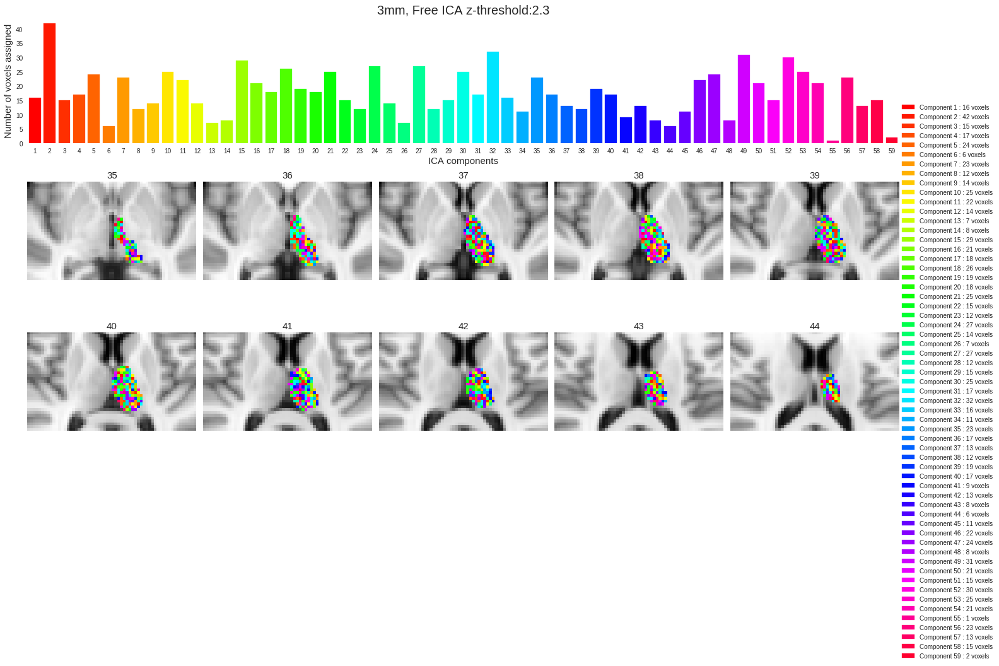

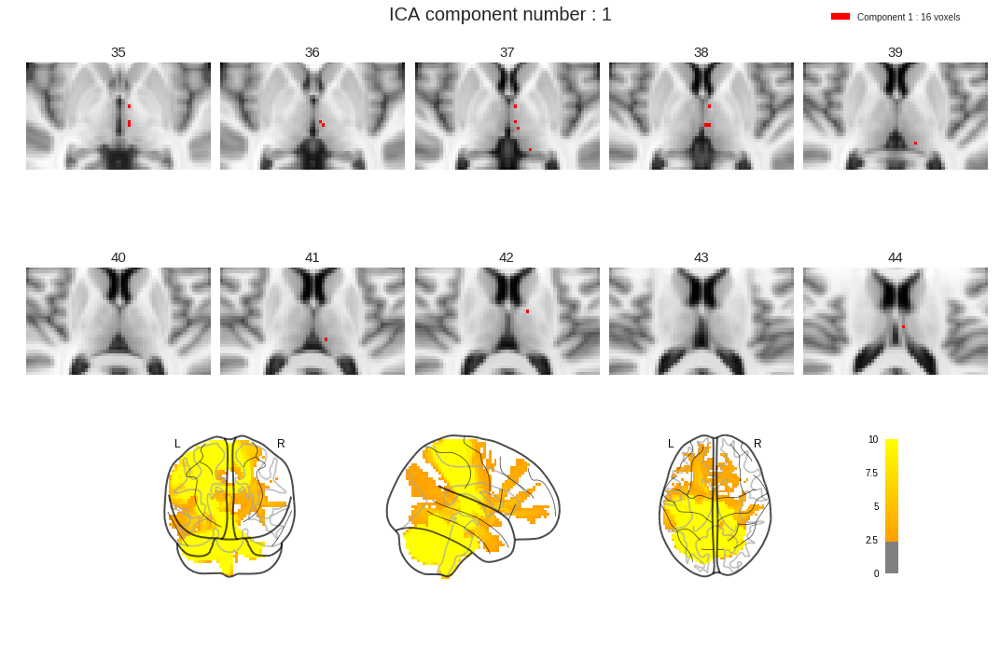

In [1408]:
melodicDir = join(melodicLoc, 'fep_ds_3_free_IC_2017_06_06') 
initialize(melodicDir, '3mm, Free ICA', 2.3)
# initialize('/Volume/CCNC_W1_2T/2017_CHR_thalamus_microstructure_kcho/allData/prac_melodic_commandline/', '')

[14, 55, 59] missingComps


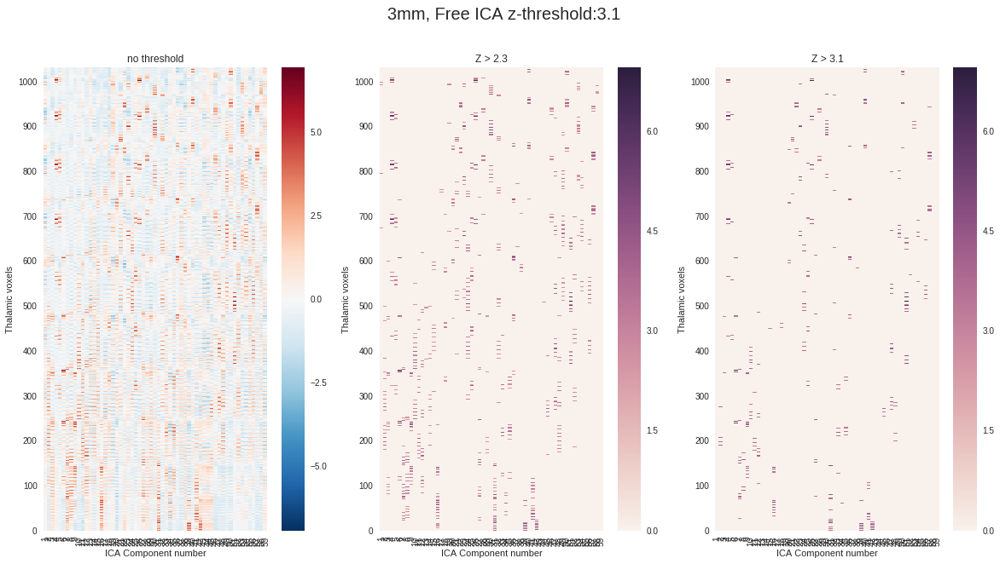

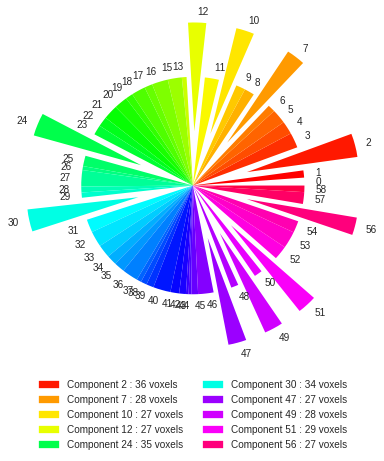

{0: 12, 1: 11, 2: 36, 3: 23, 4: 20, 5: 22, 6: 11, 7: 28, 8: 15, 9: 14, 10: 27, 11: 21, 12: 27, 13: 7, 14: 0, 15: 21, 16: 24, 17: 12, 18: 21, 19: 11, 20: 20, 21: 22, 22: 15, 23: 15, 24: 35, 25: 16, 26: 6, 27: 25, 28: 9, 29: 8, 30: 34, 31: 20, 32: 24, 33: 20, 34: 15, 35: 16, 36: 24, 37: 7, 38: 9, 39: 11, 40: 26, 41: 13, 42: 10, 43: 4, 44: 4, 45: 10, 46: 23, 47: 27, 48: 11, 49: 28, 50: 12, 51: 29, 52: 21, 53: 26, 54: 18, 55: 0, 56: 27, 57: 18, 58: 10, 59: 0}


FileNotFoundError: No such file: '/Volume/CCNC_W1_2T/2017_CHR_thalamus_microstructure_kcho/allData/prac_melodic_commandline/fep_ds_3_free_IC_2017_06_06/stats/thresh_zstat2.nii.gz'

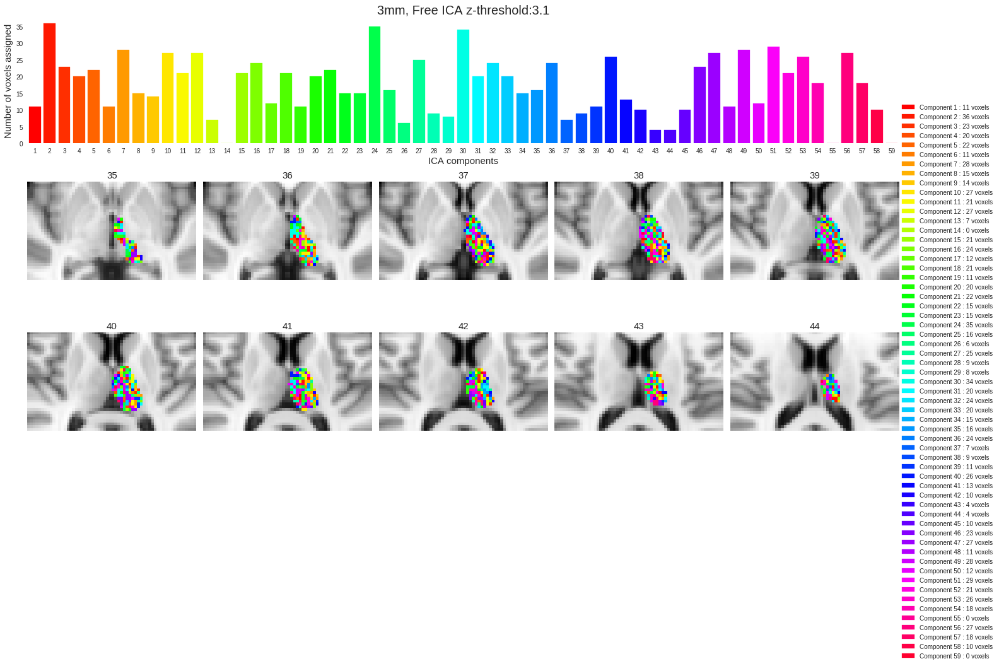

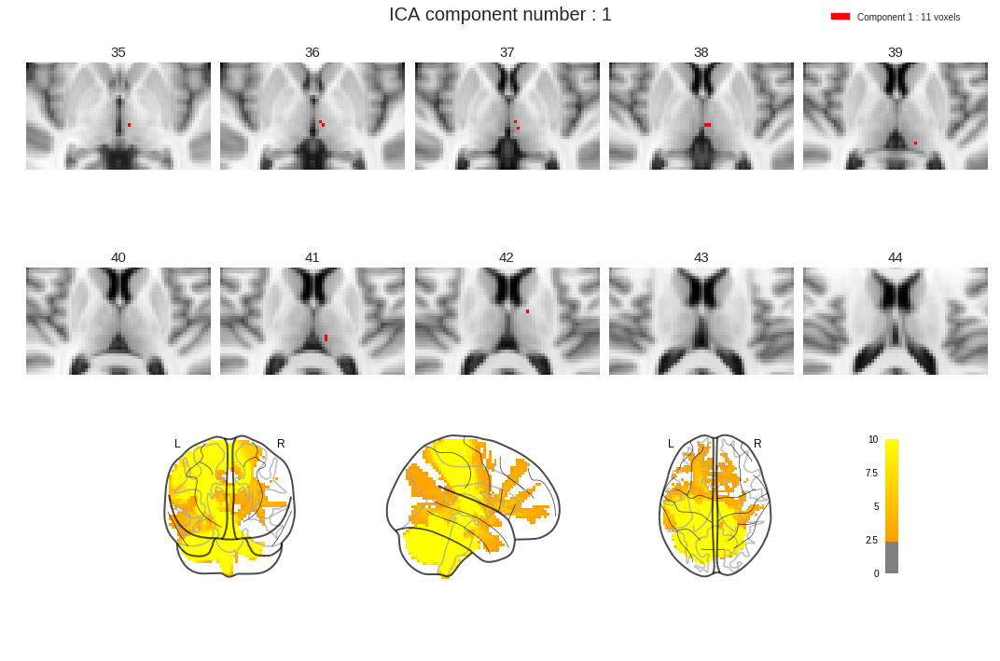

In [1412]:
melodicDir = join(melodicLoc, 'fep_ds_3_free_IC_2017_06_06') 
initialize(melodicDir, '3mm, Free ICA', 3.1)
# initialize('/Volume/CCNC_W1_2T/2017_CHR_thalamus_microstructure_kcho/allData/prac_melodic_commandline/', '')

In [561]:
display_animation(ani)

## Segmentation without threshold using fsl_glm outputs

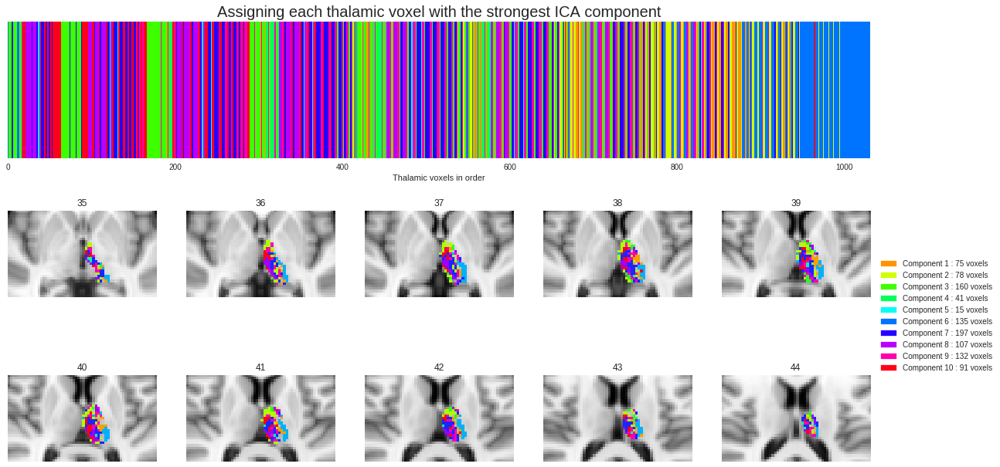

In [83]:
draw_max_segmentation_group(mat, thalData, thalInd)

# Melodic_mix output from the ICA

In [90]:
melodic_mix_loc = '/Volume/CCNC_W1_2T/2017_CHR_thalamus_microstructure_kcho/allData/prac_melodic_commandline/fep_ds_10IC_2017_06_05/melodic_mix'
melodic_mix = np.loadtxt(melodic_mix_loc)
melodic_mix_z = stats.zscore(melodic_mix)
melodic_mix_z = melodic_mix_z.reshape(melodic_mix.shape[0]/thalVoxelNum, thalVoxelNum, melodic_mix.shape[1])

/ccnc/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


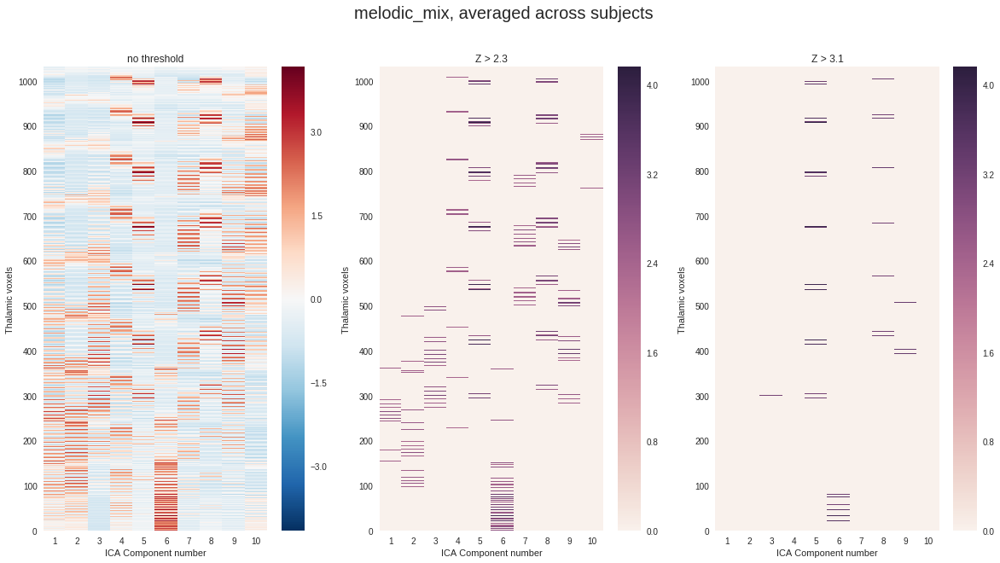

In [75]:
draw_fsl_glm_mat(melodic_mix_z.mean(axis=0), 'melodic_mix')

## Segmentation without threshold using melodic_mix

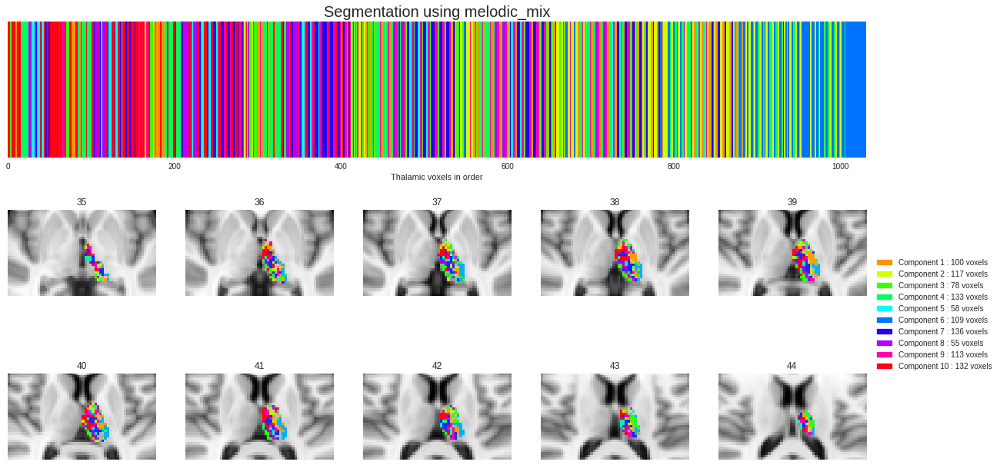

In [88]:
draw_max_segmentation_group(np.swapaxes(np.swapaxes(melodic_mix_z, 0, 1), 1, 2), thalData, thalInd,
                           'Segmentation using melodic_mix')

	Loading thalamic ROI


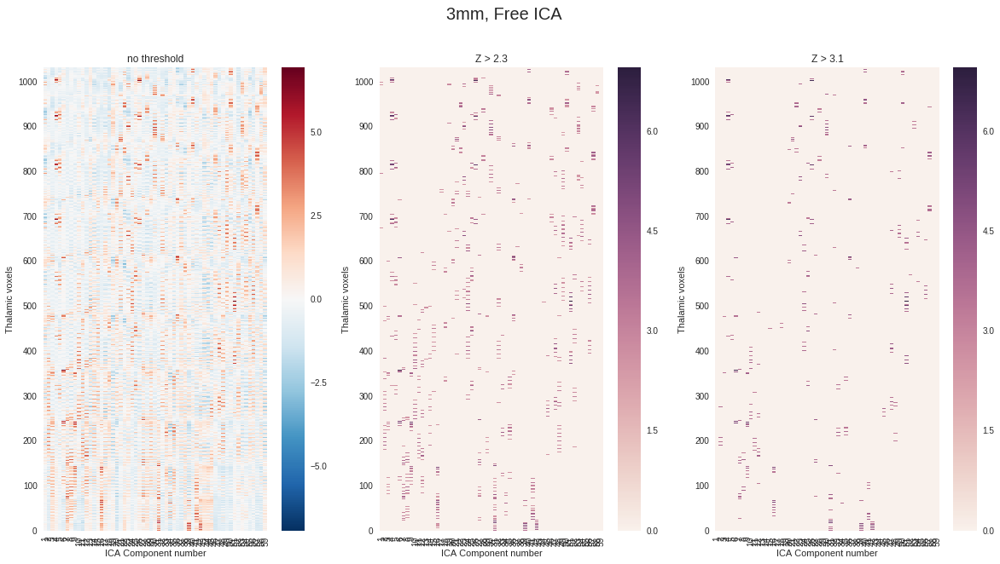

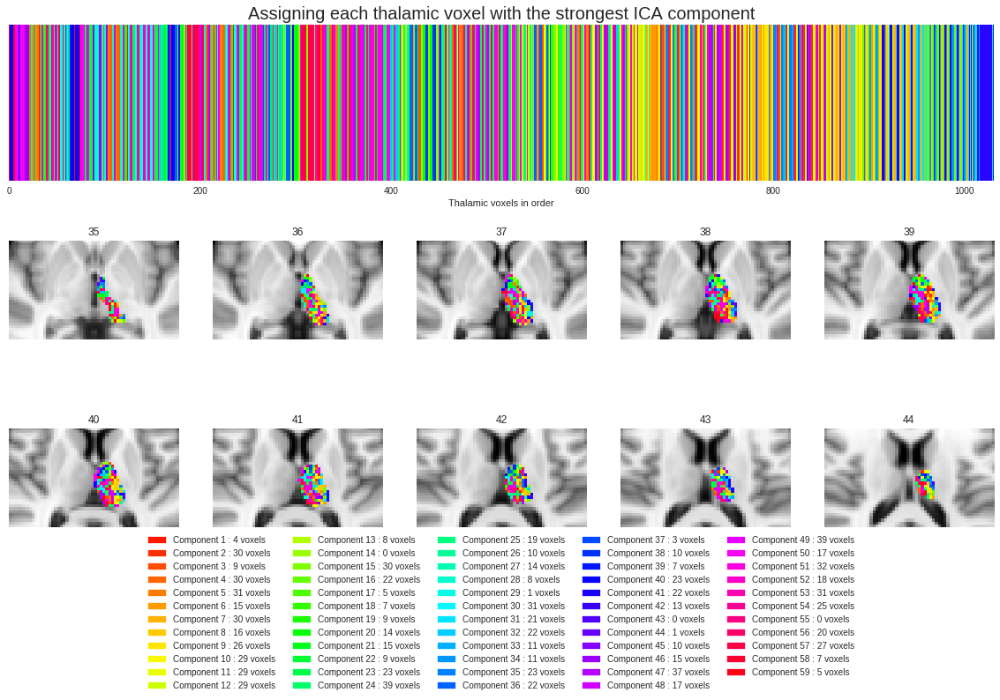

In [474]:
initialize('/Volume/CCNC_W1_2T/2017_CHR_thalamus_microstructure_kcho/allData/prac_melodic_commandline/fep_ds_3_free_IC_2017_06_06', '3mm, Free ICA')

# Affinity propagation

http://scikit-learn.org/stable/auto_examples/cluster/plot_affinity_propagation.html

In [114]:
from sklearn.cluster import AffinityPropagation
from sklearn import metrics
from sklearn.datasets.samples_generator import make_blobs

In [116]:
centers = [[1, 1], [-1, -1], [1, -1]]
X, labels_true = make_blobs(n_samples=300, centers=centers, cluster_std=0.5,
                            random_state=0)

In [117]:
centers

[[1, 1], [-1, -1], [1, -1]]

In [119]:
X.shape

(300, 2)

In [120]:
labels_true

array([0, 1, 1, 0, 0, 1, 2, 2, 1, 0, 2, 0, 0, 2, 0, 2, 2, 2, 2, 2, 0, 0, 0,
       0, 2, 0, 2, 1, 2, 1, 1, 2, 0, 1, 2, 1, 1, 1, 1, 0, 0, 0, 2, 0, 1, 2,
       2, 2, 2, 0, 0, 0, 2, 1, 1, 1, 1, 0, 1, 0, 2, 1, 1, 2, 2, 2, 2, 0, 1,
       0, 1, 2, 0, 0, 2, 2, 1, 1, 0, 2, 1, 0, 2, 1, 1, 0, 0, 1, 2, 0, 1, 0,
       1, 0, 1, 0, 1, 2, 0, 2, 0, 0, 2, 0, 0, 1, 1, 2, 1, 1, 1, 1, 1, 2, 0,
       1, 2, 2, 1, 2, 1, 1, 1, 1, 1, 1, 0, 2, 2, 2, 0, 2, 2, 1, 0, 1, 0, 2,
       1, 0, 2, 2, 2, 0, 2, 0, 1, 2, 2, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0,
       2, 1, 0, 2, 2, 2, 1, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 1,
       2, 0, 1, 2, 0, 1, 1, 1, 0, 2, 1, 2, 0, 2, 0, 2, 0, 0, 2, 1, 1, 1, 1,
       0, 2, 2, 0, 1, 1, 1, 0, 2, 0, 0, 2, 0, 1, 1, 0, 1, 2, 2, 2, 0, 0, 1,
       2, 2, 2, 1, 2, 0, 1, 1, 0, 1, 1, 2, 0, 1, 2, 0, 0, 2, 0, 2, 2, 2, 1,
       0, 2, 2, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 2, 2, 1, 0, 0, 1, 1, 1, 2, 1,
       2, 1, 1, 2, 2, 2, 1, 2, 0, 2, 1, 0, 2, 1, 1, 2, 1, 1, 1, 2, 0, 1, 2,
       2])

# GIF prac

In [249]:
from tempfile import NamedTemporaryFile
from matplotlib import animation
from IPython.display import HTML

In [714]:
plt.rcParams['savefig.bbox'] = 'tight'
IMG_TAG = """<img src="data:image/gif;base64,{0}" alt="some_text">"""

def anim_to_gif(anim):
    data="0"
    with NamedTemporaryFile(suffix='.gif') as f:
        anim.save(f.name, writer='imagemagick', fps=10);
        data = open(f.name, "rb").read()
        data = data.encode("base64")
    return IMG_TAG.format(data)

def display_animation(anim):
    plt.close(anim._fig)
    return HTML(anim_to_gif(anim))

def init():
    initialSliceNum = 20
    matplotImg = ax.imshow(mni_data[:,:, initialSliceNum])
    return matplotImg

def animate(i):
    return i+1


In [1164]:
def make_gif(thalamus_biggest=threeDmap, cmaps, title="Segmentation map"):    
    mniLoc = '/usr/share/fsl/5.0/data/standard/MNI152_T1_2mm.nii.gz'                                                                                      
    mni_nb = nb.load(mniLoc)
    mni_data = mni_nb.get_data()
    
    fig, ax = plt.subplots(ncols=1, figsize=(5,5), facecolor='white')
      
    sliceNum = 37
    sliceNumMax = 47

    ax.axes.yaxis.set_ticklabels([])
    ax.axes.xaxis.set_ticklabels([])
    ax.grid(False)

    mni_im = ax.imshow(np.flipud(mni_data[:,:,sliceNum].T), cmap='gray', animated=True)
    thal_im = ax.imshow(np.flipud(threeDmap[:,:,sliceNum].T), cmap=cmaps, animated=True)

    def updatefig(*args):
        global mni_data, threeDmap, sliceNum, sliceNumMax, cmaps

        sliceNumRange = [sliceNumMax-abs(i) for i in range(-sliceNumMax+30,sliceNumMax-30)]
        num = args[0]

        if num != 0:
            num=args[0] % len(sliceNumRange)
        else:
            num = 0

        sliceNum = sliceNumRange[num]

        mni_im.set_array(np.flipud(mni_data[:,:,sliceNum].T))
        thal_im.set_array(np.flipud(threeDmap[:,:,sliceNum].T))

        return thal_im,
    plt.suptitle(title, fontsize=20)
    frameNum = 34
    ani = animation.FuncAnimation(fig, 
                                  updatefig, 
                                  frames=frameNum, 
                                  interval=1, 
                                  blit=True)
#     display_animation(ani)
    return ani

SyntaxError: non-default argument follows default argument (<ipython-input-1164-a409334ee02e>, line 1)

In [ ]:
ani.save()

display_animation(make_gif(threeDmap, '3mm freeDS'))

In [746]:
# def pie_vox_count_threeDmap(threeDmap):
# make figure
fig, axes = plt.subplots(ncols=2, figsize=(10,5), facecolor='white')
pieAx = axes[1]
brainAx = axes[0]

# Count number of voxels in each ICA components (voxel intensities)
compNums, compVoxelCounts = np.unique(threeDmap, return_counts=True)
comp_count = dict(zip(compNums, compVoxelCounts)) # make dictionary
comp_count.pop(0) # remove 0 count

# Highlighting components with high number of voxels
meanCount = np.array(a.values()).mean()
stdCount = np.array(a.values()).std()
oneStdGt = meanCount+stdCount # Number of count, one std above mean
topCount = np.array(a.values()) > oneStdGt
explode = topCount*.5 #highlight matrix

# Draw pie graph
pies = pieAx.pie(comp_count.values(), explode=explode,labels=[int(x) for x in comp_count.keys()])

# Set the color of the pie graphs
for pieG in pies[0]:
    col = cmap_dict[int(pieG.get_label())]
    pieG.set_facecolor(col)

# If there are too many components to show
if len(comp_count.keys()) > 14:
    topComponents = topCount * comp_count.keys()
    patchesTop = [mpatches.Patch(color=cmap_dict[x], 
                              label='Component {0:0.0f} : {1} voxels'.format(x,comp_count[x])) for x in topComponents[topComponents.nonzero()]]
else:
    patchesTop = [mpatches.Patch(color=cmap_dict[x], 
                              label='Component {0:0.0f} : {1} voxels'.format(x,comp_count[x])) for x in comp_count.keys()]

pieAx.legend(handles=patchesTop,
          loc='center left', bbox_to_anchor=(1.4, 0.5),
          fancybox=True, 
          ncol=1, borderaxespad=0.)

# Brain
mniLoc = '/usr/share/fsl/5.0/data/standard/MNI152_T1_2mm.nii.gz'                                                                                      
mni_nb = nb.load(mniLoc)
mni_data = mni_nb.get_data()

sliceNum = 37
sliceNumMax = 47

brainAx.axes.yaxis.set_ticklabels([])
brainAx.axes.xaxis.set_ticklabels([])
brainAx.grid(False)

mni_im = brainAx.imshow(np.flipud(mni_data[:,:,sliceNum].T), cmap='gray', animated=True, aspect='auto')
thal_im = brainAx.imshow(np.flipud(threeDmap[:,:,sliceNum].T), cmap=cmaps, animated=True, aspect='auto')

def updatefig(*args):
    global mni_data, threeDmap, sliceNum, sliceNumMax, cmaps

    sliceNumRange = [sliceNumMax-abs(i) for i in range(-sliceNumMax+30,sliceNumMax-30)]
    num = args[0]

    if num != 0:
        num=args[0] % len(sliceNumRange)
    else:
        num = 0

    sliceNum = sliceNumRange[num]

    mni_im.set_array(np.flipud(mni_data[:,:,sliceNum].T))
    thal_im.set_array(np.flipud(threeDmap[:,:,sliceNum].T))

    return thal_im,
#     plt.suptitle(title, fontsize=20)
# fig.subplots_adjust(wspace=3, hspace=3)
# fig.subplots_adjust(left=2, bottom=0, right=3, top=1, wspace=None, hspace=None)

frameNum = 34
ani = animation.FuncAnimation(fig, 
                              updatefig, 
                              frames=frameNum, 
                              interval=1, 
                              blit=True)
display_animation(ani)
#     return ani
# plt.show()

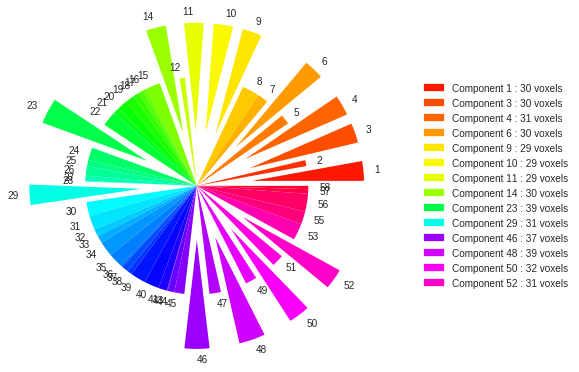

In [740]:
# def pie_vox_count_threeDmap(threeDmap):
# make figure
fig, axes = plt.subplots(ncols=1, figsize=(5,5), facecolor='white')
pieAx = axes
# brainAx = axes[1]

# Count number of voxels in each ICA components (voxel intensities)
compNums, compVoxelCounts = np.unique(threeDmap, return_counts=True)
comp_count = dict(zip(compNums, compVoxelCounts)) # make dictionary
comp_count.pop(0) # remove 0 count

# Highlighting components with high number of voxels
meanCount = np.array(a.values()).mean()
stdCount = np.array(a.values()).std()
oneStdGt = meanCount+stdCount # Number of count, one std above mean
topCount = np.array(a.values()) > oneStdGt
explode = topCount*.5 #highlight matrix

# Draw pie graph
pies = pieAx.pie(comp_count.values(), explode=explode,labels=[int(x) for x in comp_count.keys()])

# Set the color of the pie graphs
for pieG in pies[0]:
    col = cmap_dict[int(pieG.get_label())]
    pieG.set_facecolor(col)

# If there are too many components to show
if len(comp_count.keys()) > 14:
    topComponents = topCount * comp_count.keys()
    patchesTop = [mpatches.Patch(color=cmap_dict[x], 
                              label='Component {0:0.0f} : {1} voxels'.format(x,comp_count[x])) for x in topComponents[topComponents.nonzero()]]
else:
    patchesTop = [mpatches.Patch(color=cmap_dict[x], 
                              label='Component {0:0.0f} : {1} voxels'.format(x,comp_count[x])) for x in comp_count.keys()]

pieAx.legend(handles=patchesTop,
          loc='center left', bbox_to_anchor=(1.3, 0.5),
          fancybox=True, 
          ncol=1, borderaxespad=0.)

plt.show()